# 1. Imports

In [154]:
# Basic Libraries
import numpy as np  # Numerical operations
import pandas as pd  # Data manipulation and analysis
import os  # File and directory management
import warnings  # Suppress warnings
warnings.filterwarnings('ignore')

# Visualization
import matplotlib.pyplot as plt  # Plotting
import seaborn as sns  # Advanced visualizations

# Preprocessing
from sklearn.preprocessing import (
    StandardScaler, MinMaxScaler, LabelEncoder, OneHotEncoder, label_binarize
)
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Data Splitting and Validation
from sklearn.model_selection import (
    train_test_split, StratifiedKFold, GridSearchCV, cross_val_score, ParameterGrid
)

# Metrics and Evaluation
from sklearn.metrics import (
    accuracy_score, confusion_matrix, classification_report, 
    precision_score, recall_score, f1_score, roc_curve, auc, 
    roc_auc_score, silhouette_score
)

# Machine Learning Models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture

# Deep Learning
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

# Handling Imbalanced Data
from imblearn.over_sampling import SMOTE

# Dimensionality Reduction
from sklearn.decomposition import PCA

# Statistical Analysis
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from scipy.cluster.hierarchy import dendrogram, linkage, cut_tree
from scipy.optimize import linear_sum_assignment
from scipy.stats import zscore

# Advanced Models
import xgboost as xgb
from xgboost import XGBClassifier

# Utility for Clustering
from kneed import KneeLocator

# Display Utilities
from IPython.display import display, HTML

# Additional Metrics
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples

# 2. Load Datasets

The code reads multiple CSV files containing cotton and rice crop data for the years 2021, 2022, and 2023. It uses the pd.read_csv() function from the pandas library to load each dataset into a separate DataFrame. Raw string literals (denoted by r) are used to handle file paths, ensuring that backslashes are correctly interpreted.

In [155]:
# Load datasets using raw strings
cotton2021 = pd.read_csv(r'Crop-dataset\Cotton\cotton2021.csv')
cotton2022 = pd.read_csv(r'Crop-dataset\Cotton\cotton2022.csv')
cotton2023 = pd.read_csv(r'Crop-dataset\Cotton\cotton2023.csv')

rice2021 = pd.read_csv(r'Crop-dataset\Rice\rice2021.csv')
rice2022 = pd.read_csv(r'Crop-dataset\Rice\rice2022.csv')
rice2023 = pd.read_csv(r'Crop-dataset\Rice\rice2023.csv')

# 3. Display Datasets Before Preprocessing

## 3.1. Display Cotton Dataset

### 3.1.1. Display Cotton 2021 Dataset

In [156]:
cotton2021

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.153184,0.222615,0.498528,0.611280,0.285032,0.112775,0.529626,0.546617,0.604374,0.571359,0.620985,0.496628
1,0.137897,0.106036,0.169626,0.330396,0.594655,0.227967,0.578199,0.661604,0.783454,0.777313,0.729177,0.636792
2,0.122481,0.088123,0.182121,0.376037,0.431042,0.350422,0.630027,0.724557,0.844643,0.673307,0.736385,0.635118
3,0.085279,0.091887,0.140729,0.243528,0.224835,0.046875,0.579180,0.666857,0.611009,0.625423,0.612167,0.208681
4,0.091678,0.094313,0.247900,0.367800,0.546883,0.476697,0.699308,0.768818,0.753445,0.711491,0.707040,0.647931
...,...,...,...,...,...,...,...,...,...,...,...,...
2878,0.138030,0.329907,0.404328,0.537815,0.394826,0.113851,0.359073,0.649917,0.704158,0.726696,0.859813,0.355916
2879,0.523488,0.332649,0.226471,0.513300,0.600642,0.144718,0.612667,0.662235,0.560400,0.612191,0.804607,0.288965
2880,0.726984,0.400091,0.197898,0.247069,0.225268,0.082729,0.429161,0.774492,0.816801,0.853505,0.847405,0.730276
2881,0.265939,0.358320,0.435546,0.604886,0.475097,0.090206,0.519311,0.576597,0.691638,0.750179,0.758183,0.588785


### 3.1.2. Display Cotton 2022 Dataset

In [157]:
cotton2022

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.088053,0.122912,0.203632,0.413183,0.824614,-0.012009,0.707493,0.553634,0.678005,0.601276,0.558074,0.264170
1,0.153362,0.306787,0.199341,0.344232,0.565855,-0.013706,0.512479,0.383124,0.508259,0.485459,0.426386,0.201609
2,0.106067,0.140156,0.328443,0.432596,0.567783,0.049462,0.738598,0.613374,0.881896,0.774641,0.718519,0.608508
3,0.091542,0.120096,0.244057,0.370085,0.502907,0.016404,0.617543,0.638213,0.856499,0.782228,0.730698,0.588019
4,0.080412,0.116872,0.291829,0.427347,0.688564,0.012112,0.517153,0.594714,0.845494,0.772517,0.730694,0.628959
...,...,...,...,...,...,...,...,...,...,...,...,...
12406,0.131888,0.113150,0.121260,0.114818,0.081116,0.001597,0.153307,0.304461,0.571842,0.608527,0.444227,0.364133
12407,0.185016,0.155825,0.146379,0.107036,0.067559,-0.020984,0.119457,0.178660,0.458241,0.513371,0.457156,0.394199
12408,0.122058,0.108996,0.126322,0.141570,0.128411,0.003110,0.165837,0.070270,0.196294,0.088979,0.081822,0.084518
12409,0.172523,0.168709,0.168362,0.139394,0.108651,-0.045763,0.254163,0.055743,0.131894,0.077957,0.081376,0.077510


### 3.1.3. Display Cotton 2023 Dataset

In [158]:
cotton2023

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.112304,0.168831,0.357419,0.652470,0.511220,0.071754,0.746601,0.714075,0.747262,0.729675,0.634746,0.199640
1,0.111033,0.149460,0.360941,0.404814,0.385993,0.089474,0.647436,0.637131,0.677606,0.663667,0.581217,0.438363
2,0.102703,0.226310,0.554877,0.790602,0.812145,0.090364,0.866772,0.787777,0.838983,0.784251,0.711433,0.869757
3,0.090742,0.079962,0.355833,0.864751,0.837066,0.149301,0.890619,0.795135,0.834237,0.774393,0.683996,0.840936
4,0.100312,0.077954,0.328019,0.697031,0.722988,0.242764,0.869281,0.811822,0.836173,0.802686,0.700463,0.848245
...,...,...,...,...,...,...,...,...,...,...,...,...
11772,0.130143,0.108247,0.109874,0.177338,0.178003,0.092314,0.436729,0.753542,0.868271,0.834823,0.768142,0.470518
11773,0.565473,0.733032,0.280702,0.463700,0.737765,0.328413,0.229008,0.707480,0.875504,0.923436,0.852439,0.830161
11774,0.167851,0.204945,0.371220,0.378095,0.233630,0.287593,0.615308,0.655678,0.807842,0.835634,0.825262,0.797595
11775,0.152844,0.371162,0.582090,0.826781,0.881840,0.509232,0.730275,0.321719,0.767047,0.877766,0.866667,0.817833


## 3.2. Display Rice Dataset

### 3.2.1. Display Rice 2021 Dataset

In [159]:
rice2021

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.098886,0.103672,0.238722,0.478474,0.429209,0.281007,0.605667,0.291368,0.133020,0.779261,0.818019,0.721222
1,0.118790,0.147110,0.218349,0.652877,0.513883,0.039530,0.702403,0.646029,0.162462,0.204209,0.363850,0.155452
2,0.181040,0.146681,0.227818,0.528602,0.413309,0.041322,0.671362,0.679732,0.602896,0.199579,0.373932,0.143989
3,0.220000,0.143860,0.197724,0.676182,0.534545,0.054701,0.706315,0.636900,0.216295,0.216854,0.239008,0.171939
4,0.113367,0.139415,0.411447,0.637250,0.466728,0.045908,0.691222,0.654271,0.589966,0.208658,0.211051,0.161702
...,...,...,...,...,...,...,...,...,...,...,...,...
414,0.174410,0.089574,0.409769,0.602472,0.360485,0.478802,0.669603,0.279522,0.186710,0.625578,0.933573,0.793798
415,0.124839,0.095548,0.392523,0.628841,0.453770,0.067350,0.591837,0.426808,0.712821,0.888472,0.899105,0.766911
416,0.161652,0.274931,0.581613,0.670435,0.428686,0.080011,0.217853,0.231816,0.460350,0.821652,0.829357,0.696429
417,0.141479,0.125532,0.159142,0.327632,0.307484,0.443808,0.674027,0.787402,0.780147,0.560878,0.274074,0.195003


### 3.2.2. Display Rice 2022 Dataset

In [160]:
rice2022

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.442943,0.325107,0.448911,0.698456,1.000000,0.071374,0.714939,0.588107,0.571895,0.787698,0.816302,0.613884
1,0.128122,0.352554,0.533025,0.647528,1.000000,0.052378,0.534581,0.511706,0.562397,0.275249,0.553359,0.565554
2,0.400911,0.406091,0.443299,0.535024,0.978224,0.073414,0.387755,0.484515,0.605432,0.570827,0.636029,0.553675
3,0.390117,0.728009,0.760038,0.786063,1.000000,0.059971,0.555362,0.699239,0.893971,0.942492,0.869822,0.759206
4,0.117680,0.111500,0.102671,0.126739,0.144219,0.077910,0.204507,0.600983,0.762850,0.838978,0.824411,0.738954
...,...,...,...,...,...,...,...,...,...,...,...,...
4682,0.144404,0.130435,0.267739,0.273391,0.705258,0.608263,0.519339,0.483456,0.301149,0.184329,0.489453,0.671942
4683,0.144395,0.166874,0.304348,0.404255,0.654962,0.554571,0.747805,0.598974,0.739962,0.651039,0.542270,0.507232
4684,0.133390,0.277693,0.491424,0.733867,0.944731,0.686950,0.797565,0.593707,0.526810,0.454545,0.238906,0.218204
4685,0.103372,0.172175,0.415501,0.638936,0.612252,0.496590,0.510204,0.472645,0.386538,0.312476,0.273450,0.320506


### 3.2.3. Display Rice 2023 Dataset

In [161]:
rice2023

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.219298,0.406830,0.620985,0.841141,0.982545,0.168539,0.784436,0.203078,0.182609,0.256804,0.381433,0.485466
1,0.290999,0.260493,0.473620,0.485981,0.650122,0.133713,1.000000,0.694864,0.665847,0.657620,0.687118,0.722555
2,0.119565,0.142857,0.124230,0.318060,0.185724,0.169022,0.510106,0.238587,0.101852,0.187604,0.160437,0.304826
3,0.242507,0.235010,0.282532,0.393004,0.318597,0.168026,0.767211,0.325995,0.232826,0.341040,0.331269,0.440540
4,0.312309,0.350049,0.657402,0.818031,0.982894,0.213175,0.591485,0.517812,0.670632,0.794137,0.791589,0.792854
...,...,...,...,...,...,...,...,...,...,...,...,...
914,0.331873,0.637595,0.860933,0.936457,0.771076,0.402954,0.884208,0.515337,0.851545,0.908714,0.895963,0.858908
915,0.333794,0.621409,0.841538,0.909154,0.736736,0.384046,0.886665,0.485586,0.846778,0.907973,0.904183,0.876847
916,0.373900,0.618582,0.856424,0.903326,0.781238,0.375578,0.889700,0.532434,0.844510,0.911383,0.905652,0.899614
917,0.349008,0.556529,0.855942,0.925486,0.800000,0.347044,0.895157,0.473819,0.812193,0.904762,0.899269,0.903632


# 4. Preprocessing

## 4.1. Combine Datasets Yearly

The code adds a label column to each dataset, assigning 0 for cotton and 1 for rice, to distinguish between the two crops. It then combines the cotton and rice datasets for each year (2021, 2022, 2023) using pd.concat(), creating a single DataFrame for each year with the ignore_index=True option to reset the index.

In [162]:
# Add a label column to each dataset (0 for cotton, 1 for rice)
cotton2021['label'] = 0
rice2021['label'] = 1
cotton2022['label'] = 0
rice2022['label'] = 1
cotton2023['label'] = 0
rice2023['label'] = 1

# Combine the datasets for each year
year_2021 = pd.concat([cotton2021, rice2021], ignore_index=True)
year_2022 = pd.concat([cotton2022, rice2022], ignore_index=True)
year_2023 = pd.concat([cotton2023, rice2023], ignore_index=True)

## 4.2. Scaling, Impute Missing Values, Drop Duplicates, Handle Outliers

The preprocess_dataset function processes a given dataset by performing several key tasks: scaling numerical features using MinMaxScaler, imputing missing values with the median, removing duplicates, and handling outliers using the Interquartile Range (IQR) method. The function returns a cleaned and preprocessed version of the dataset.

In [163]:
# Preprocessing Function
def preprocess_dataset(dataset):
    """
    Preprocess a dataset by scaling, handling missing values, duplicates, and outliers.
    """
    dataset = dataset.copy()  # Avoid modifying the original dataset

    # 1. Scale numerical features using MinMaxScaler
    num_cols = dataset.select_dtypes(include=[np.number]).columns
    scaler = MinMaxScaler()
    dataset[num_cols] = scaler.fit_transform(dataset[num_cols])

    # 2. Impute Missing Values (numerical columns with median)
    dataset[num_cols] = dataset[num_cols].fillna(dataset[num_cols].median())

    # 3. Remove Duplicates
    dataset = dataset.drop_duplicates()

    # 4. Handle Outliers using IQR
    Q1 = dataset[num_cols].quantile(0.25)
    Q3 = dataset[num_cols].quantile(0.75)
    IQR = Q3 - Q1
    dataset = dataset[~((dataset[num_cols] < (Q1 - 1.5 * IQR)) | (dataset[num_cols] > (Q3 + 1.5 * IQR))).any(axis=1)]

    return dataset

## 4.3. Apply Preprocessing On Yearly Datasets

The code applies the preprocess_dataset function to each of the cotton and rice datasets for the years 2021, 2022, and 2023. This ensures that all datasets undergo the preprocessing steps, such as scaling, handling missing values, removing duplicates, and addressing outliers, before being stored in their respective variables.

In [164]:
# Preprocess individual datasets
cotton2021 = preprocess_dataset(cotton2021)
cotton2022 = preprocess_dataset(cotton2022)
cotton2023 = preprocess_dataset(cotton2023)
rice2021 = preprocess_dataset(rice2021)
rice2022 = preprocess_dataset(rice2022)
rice2023 = preprocess_dataset(rice2023)

## 4.4. Apply Time-Series Augmentation

The sliding_window_augment function generates augmented time-series data using a sliding window approach. It creates new rows by averaging the values within a window of a specified size and appends them to the dataset until the target size is reached, then returns a shuffled version of the augmented data.

In [165]:
window_size = 3
def sliding_window_augment(dataset, target_size, window_size):
    """
    Augments a time-series dataset using a sliding window approach.
    
    Parameters:
    - dataset: pd.DataFrame, the input dataset (time-series format).
    - target_size: int, the desired number of rows after augmentation.
    - window_size: int, size of the sliding window.
    
    Returns:
    - augmented_data: pd.DataFrame, the augmented dataset.
    """
    augmented_data = dataset.copy()
    while len(augmented_data) < target_size:
        for i in range(len(dataset) - window_size + 1):
            window = dataset.iloc[i:i + window_size].mean(axis=0)
            augmented_data = pd.concat([augmented_data, window.to_frame().T], ignore_index=True)
            if len(augmented_data) >= target_size:
                break
    return augmented_data.sample(frac=1, random_state=42).reset_index(drop=True)


The code sets the target sizes for the cotton and rice datasets. The target size for cotton is determined by the largest dataset among the three years, while the target size for rice is set to the largest dataset for rice. These sizes will be used for data augmentation.

In [166]:
# Set target sizes (matching the largest dataset for cotton and half of that for rice)
cotton_target_size = max(len(cotton2021), len(cotton2022), len(cotton2023))
rice_target_size =  max(len(rice2021), len(rice2022), len(rice2023))  

The code applies the sliding_window_augment function to augment each dataset (cotton and rice for the years 2021, 2022, and 2023) by generating new rows using a sliding window approach. The target size for each dataset is set based on the largest dataset for cotton and half of that size for rice, ensuring consistent dataset sizes after augmentation.

In [167]:
# Augment datasets
cotton2021 = sliding_window_augment(cotton2021, cotton_target_size, window_size)
cotton2022 = sliding_window_augment(cotton2022, cotton_target_size, window_size)
cotton2023 = sliding_window_augment(cotton2023, cotton_target_size, window_size)

rice2021 = sliding_window_augment(rice2021, rice_target_size, window_size)
rice2022 = sliding_window_augment(rice2022, rice_target_size, window_size)
rice2023 = sliding_window_augment(rice2023, rice_target_size, window_size)

## 4.5. Labeling And Combining By Year

The code adds a 'label' column to each dataset, assigning 0 for cotton and 1 for rice, to differentiate between the two crops. It then combines the cotton and rice datasets for each year (2021, 2022, 2023) using pd.concat(), creating a unified DataFrame for each year, with the ignore_index=True option to reset the index.

In [168]:
# Add a label column to each dataset (0 for cotton, 1 for rice)
cotton2021['label'] = 0
rice2021['label'] = 1
cotton2022['label'] = 0
rice2022['label'] = 1
cotton2023['label'] = 0
rice2023['label'] = 1

# Combine the datasets for each year
year_2021 = pd.concat([cotton2021, rice2021], ignore_index=True)
year_2022 = pd.concat([cotton2022, rice2022], ignore_index=True)
year_2023 = pd.concat([cotton2023, rice2023], ignore_index=True)

# 5. Display Datasets After Preprocessing

## 5.1. Display Year 2021

In [169]:
year_2021

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.069597,0.141054,0.198996,0.375240,0.452173,0.454436,0.712408,0.694466,0.761439,0.790032,0.720054,0.615101,0
1,0.067147,0.106424,0.265463,0.433251,0.475992,0.340641,0.760638,0.738710,0.731792,0.699596,0.590269,0.517468,0
2,0.094025,0.119312,0.298796,0.478398,0.573099,0.377466,0.784848,0.744491,0.816593,0.693287,0.596358,0.448917,0
3,0.101452,0.144703,0.343264,0.445035,0.488920,0.202250,0.721382,0.600926,0.651573,0.631421,0.547954,0.383542,0
4,0.109263,0.069773,0.234746,0.375641,0.367834,0.487190,0.779981,0.818302,0.796236,0.774273,0.683630,0.693941,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12260,0.147581,0.072749,0.399610,0.620255,0.310964,0.515315,0.864419,0.463562,0.537738,0.726036,0.678871,0.643880,1
12261,0.182620,0.129507,0.227229,0.765039,0.435692,0.073445,0.945120,0.665020,0.293065,0.154263,0.249766,0.039300,1
12262,0.093341,0.109904,0.442046,0.682536,0.407184,0.191793,0.834544,0.410846,0.239273,0.252189,0.399574,0.303141,1
12263,0.093735,0.190122,0.815871,0.903496,0.375103,0.151010,0.708365,0.325965,0.736671,0.932456,0.787773,0.837922,1


## 5.2. Display Year 2022

In [170]:
year_2022

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.090616,0.145198,0.149247,0.353575,0.672390,0.786101,0.615950,0.547400,0.681824,0.627239,0.161790,0.252004,0
1,0.065584,0.065495,0.076299,0.226814,0.413699,0.672516,0.704812,0.731673,0.494819,0.515123,0.522372,0.525775,0
2,0.067748,0.090863,0.144928,0.249751,0.334825,0.355919,0.429468,0.551870,0.633593,0.561098,0.477561,0.118857,0
3,0.075602,0.094217,0.196352,0.402513,0.927018,0.391393,0.764430,0.871431,0.751782,0.706357,0.663450,0.748387,0
4,0.216963,0.104912,0.210915,0.323466,0.820415,0.785153,0.928367,0.599254,0.823536,0.711534,0.634629,0.713114,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12260,0.307028,0.518433,0.673112,0.537503,0.244176,0.117133,0.711840,0.254012,0.633128,0.834022,0.894908,0.892906,1
12261,0.055066,0.023066,0.018955,0.030034,0.116841,0.089278,0.715708,0.784769,0.847869,0.815763,0.811863,0.604247,1
12262,0.083499,0.451181,0.628647,0.790154,1.000000,0.234860,0.468335,0.781005,0.699113,0.709626,0.643752,0.565692,1
12263,0.130769,0.067363,0.065714,0.075169,0.195743,0.211774,0.278306,0.441602,0.749725,0.812780,0.737326,0.709438,1


## 5.3. Display Year 2023

In [171]:
year_2023

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.158411,0.183241,0.481080,0.393799,0.564814,0.375931,0.849754,0.652081,0.707407,0.733512,0.670182,0.058125,0
1,0.105642,0.130118,0.286970,0.439845,0.679955,0.526112,0.809165,0.629024,0.691915,0.678889,0.642065,1.000000,0
2,0.130590,0.145307,0.232691,0.359340,0.894915,0.929461,1.000000,0.794059,0.766812,0.661100,0.636014,0.605817,0
3,0.166941,0.149099,0.339433,0.814339,0.633870,0.800797,0.814114,0.774276,0.840249,0.744349,0.658633,0.489404,0
4,0.131044,0.145780,0.408093,0.876628,0.904071,0.860537,0.870435,0.678273,0.729744,0.668707,0.569465,0.573945,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12260,0.191412,0.483615,0.766350,0.905983,0.922044,0.238239,0.529822,0.495074,0.812418,0.855408,0.851088,0.519414,1
12261,0.133914,0.552384,0.849152,0.878799,0.915965,0.193646,0.175270,0.454531,0.733702,0.850868,0.886772,0.830137,1
12262,0.184586,0.385875,0.750606,0.867313,0.894357,0.566096,0.395237,0.622070,0.832184,0.876857,0.866612,0.728517,1
12263,0.243887,0.391573,0.408781,0.682954,0.905591,0.827150,0.802731,0.365137,0.364257,0.554675,0.723141,0.767872,1


# 6. Display Correlation

## 6.1. Plotting Confusion Matrix For Combined Datasets

The code defines a list datasets containing the datasets for 2021, 2022, and 2023. It then defines the plot_correlation_matrix function, which calculates and visualizes the correlation matrix of a given dataset using a heatmap. Finally, the function is called for each dataset in the list to display the correlation matrix for each year.

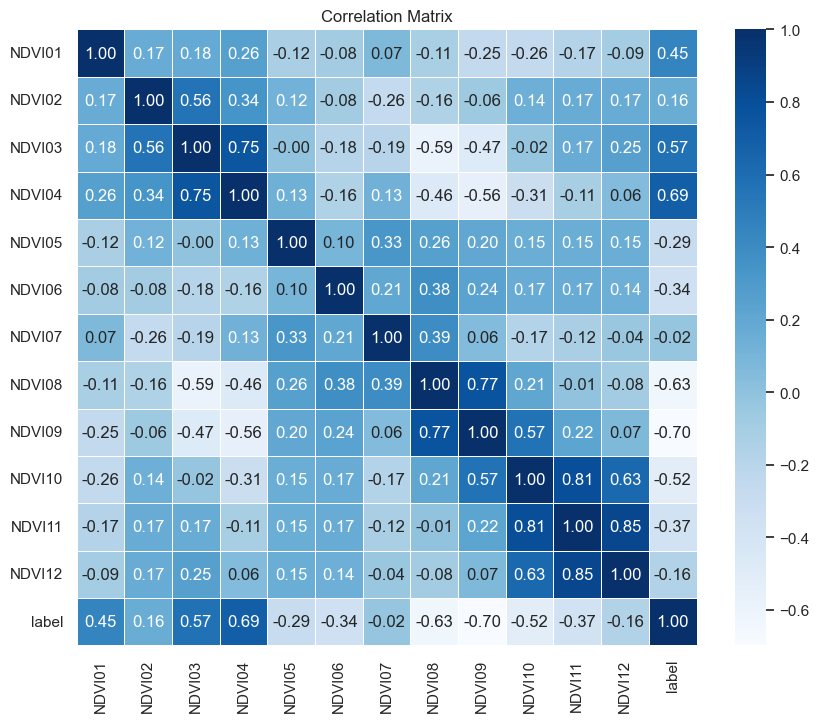

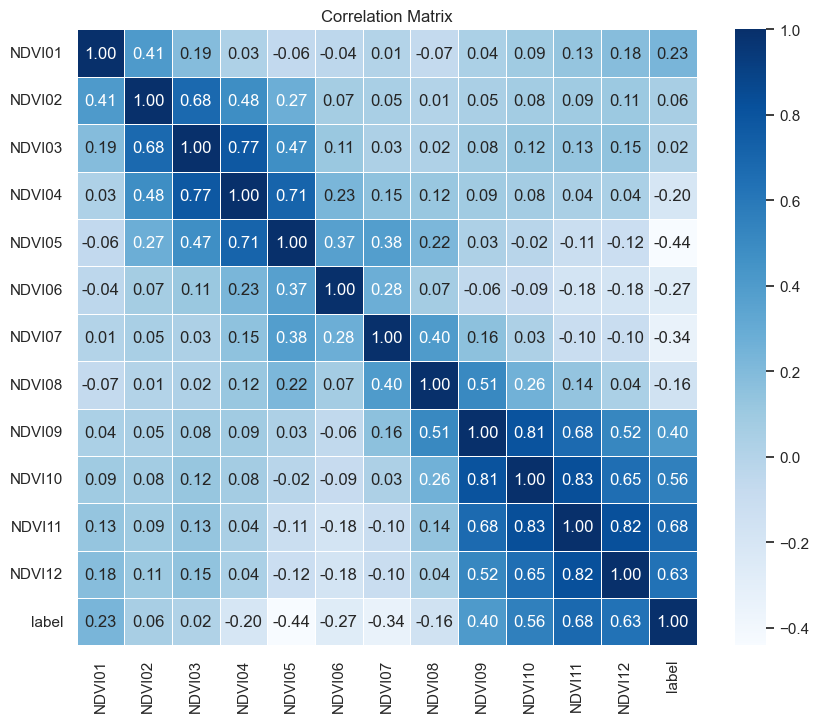

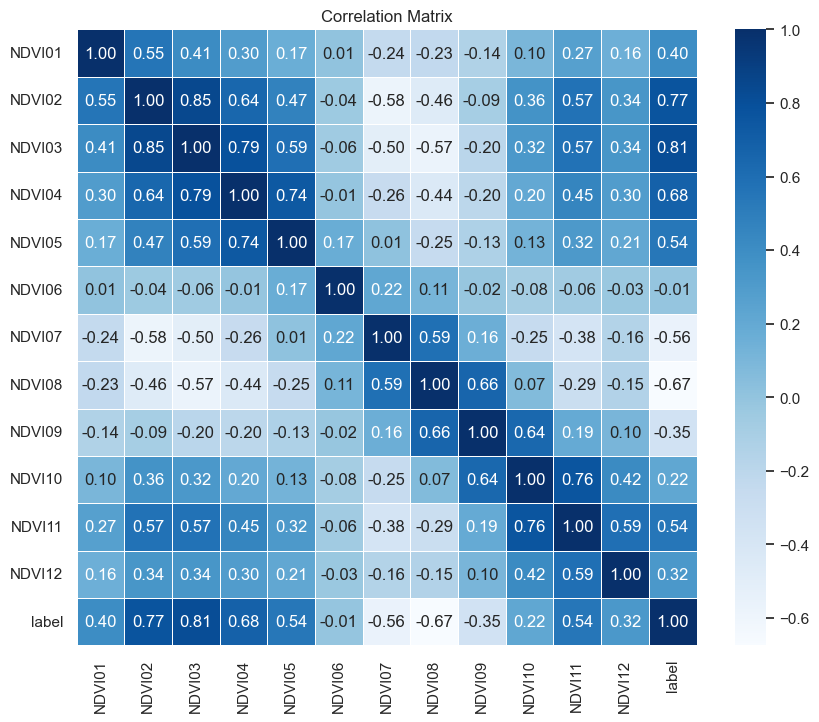

In [172]:
# Select the datasets for 2021, 2022, and 2023
datasets = [year_2021, year_2022, year_2023]

# Function to plot correlation matrix
def plot_correlation_matrix(df, title="Correlation Matrix"):
    # Calculate the correlation matrix
    correlation_matrix = df.corr()

    # Create a heatmap to visualize the correlation matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)
    plt.title(title)
    plt.show()

# Plot correlation matrices for each dataset
for dataset in datasets:
    plot_correlation_matrix(dataset)


## 6.2. Printing VIF Values For Combined Datasets

The code defines a function calculate_vif to compute the Variance Inflation Factor (VIF) values for each feature in a dataset. It adds a constant column to the dataset (to represent the intercept in regression), then calculates the VIF for each numeric feature. The print_vif function iterates over the datasets (for 2021, 2022, and 2023), selects only numeric columns, calculates the VIF, and prints the results for each dataset.

In [173]:
# Function to calculate VIF values
def calculate_vif(df):
    # Add constant to the DataFrame (intercept for regression)
    X = add_constant(df)
    
    # Calculate VIF for each feature
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    return vif_data

# Assuming your datasets are stored in variables like cotton2021, cotton2022, etc.

datasets = [year_2021, year_2022, year_2023]

# Function to print VIF values for each dataset
def print_vif(datasets):
    for df in datasets:
        print(f"VIF values for dataset:")
        # Select only numeric columns for VIF calculation
        numeric_df = df.select_dtypes(include=[np.number])
        vif_values = calculate_vif(numeric_df)
        print(vif_values)
        print("\n" + "="*50 + "\n")

# Print VIF values for each dataset
print_vif(datasets)

VIF values for dataset:
   Feature         VIF
0    const  163.074672
1   NDVI01    1.423361
2   NDVI02    1.846067
3   NDVI03    4.563634
4   NDVI04    4.326195
5   NDVI05    1.629162
6   NDVI06    1.300487
7   NDVI07    1.936497
8   NDVI08    5.463538
9   NDVI09    5.918056
10  NDVI10    6.128493
11  NDVI11    8.184120
12  NDVI12    4.298508
13   label    5.389428


VIF values for dataset:
   Feature        VIF
0    const  36.120725
1   NDVI01   1.321477
2   NDVI02   2.214074
3   NDVI03   3.896677
4   NDVI04   4.187829
5   NDVI05   2.899475
6   NDVI06   1.218145
7   NDVI07   1.500406
8   NDVI08   1.851556
9   NDVI09   4.118486
10  NDVI10   5.200600
11  NDVI11   6.325412
12  NDVI12   3.296185
13   label   3.076122


VIF values for dataset:
   Feature        VIF
0    const  97.030675
1   NDVI01   1.574536
2   NDVI02   5.891125
3   NDVI03   6.841844
4   NDVI04   3.843108
5   NDVI05   2.913031
6   NDVI06   1.124687
7   NDVI07   2.782614
8   NDVI08   4.347614
9   NDVI09   5.538388
10  NDV

## 6.3. Plotting VIF Graph For Combined Datasets 

The code defines the calculate_vif function to compute the Variance Inflation Factor (VIF) for each feature in a dataset, adding a constant column for the intercept. The plot_vif function iterates through the datasets (for the years 2021, 2022, and 2023), calculates the VIF for numeric columns, and then plots a bar chart for each dataset using seaborn to visualize the VIF values, which helps identify multicollinearity in the features.

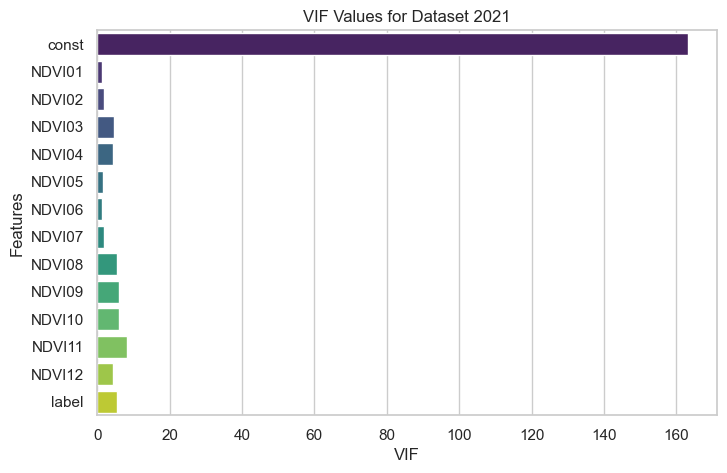

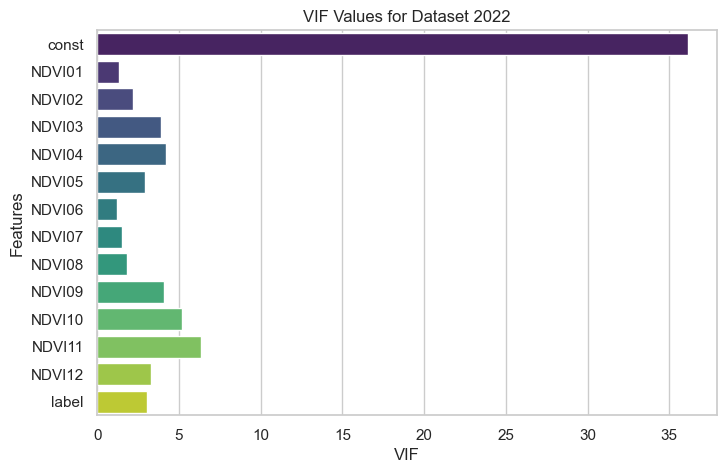

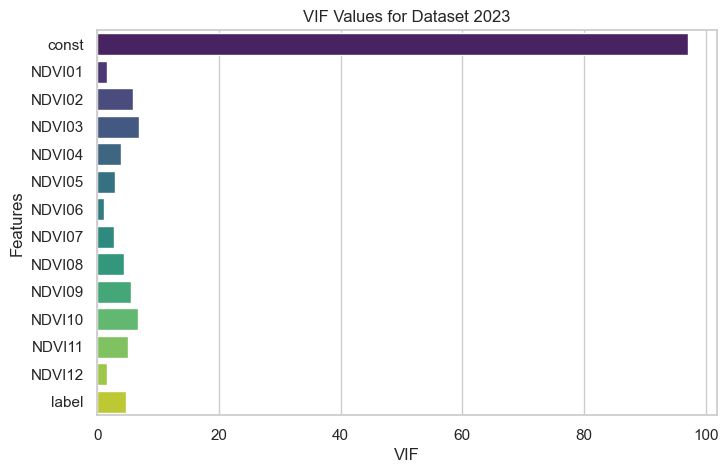

In [174]:
# Function to calculate VIF values
def calculate_vif(df):
    # Add constant to the DataFrame (intercept for regression)
    X = add_constant(df)
    
    # Calculate VIF for each feature
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    return vif_data

# Assuming your datasets are stored in variables like cotton2021, cotton2022, etc.

datasets = [year_2021, year_2022, year_2023]

# Function to plot VIF values for each dataset
def plot_vif(datasets):
    for idx, df in enumerate(datasets):
        # Select only numeric columns for VIF calculation
        numeric_df = df.select_dtypes(include=[np.number])
        vif_values = calculate_vif(numeric_df)
        
        # Plot the VIF values
        plt.figure(figsize=(8, 5))
        sns.barplot(x='VIF', y='Feature', data=vif_values, palette='viridis')
        plt.title(f'VIF Values for Dataset {idx + 2021}')
        plt.xlabel('VIF')
        plt.ylabel('Features')
        plt.show()

# Plot VIF values for each dataset
plot_vif(datasets)


# 7. Display Frequency Of Classes

The code sets the plot style to "whitegrid" using sns.set(), then iterates through the datasets for the years 2021, 2022, and 2023. For each year, it generates a count plot to visualize the distribution of the target variable label (where 0 represents Cotton and 1 represents Rice), displaying the count of each class for the respective year. Each plot is customized with titles, labels, and rotated x-axis ticks for better readability.

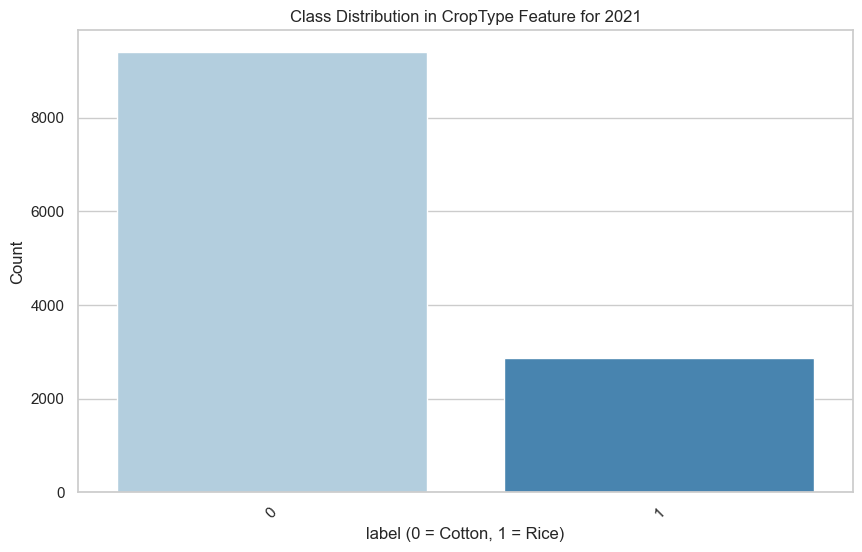

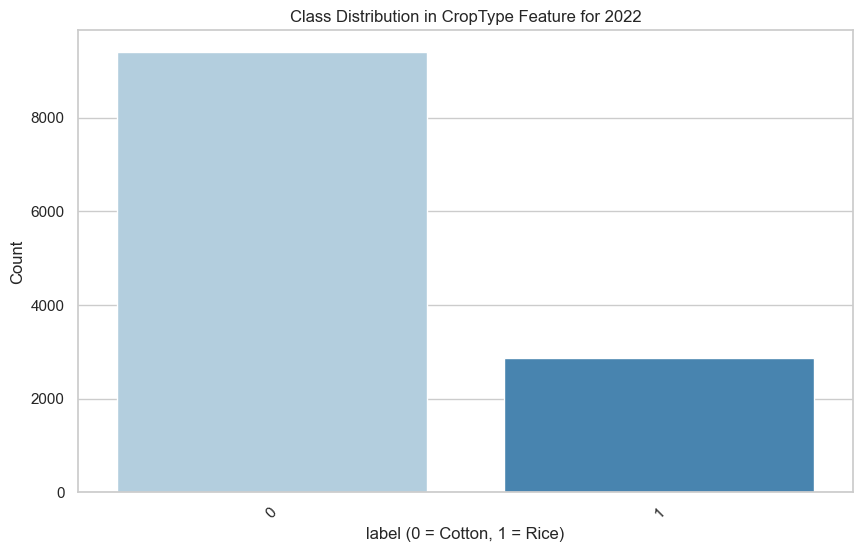

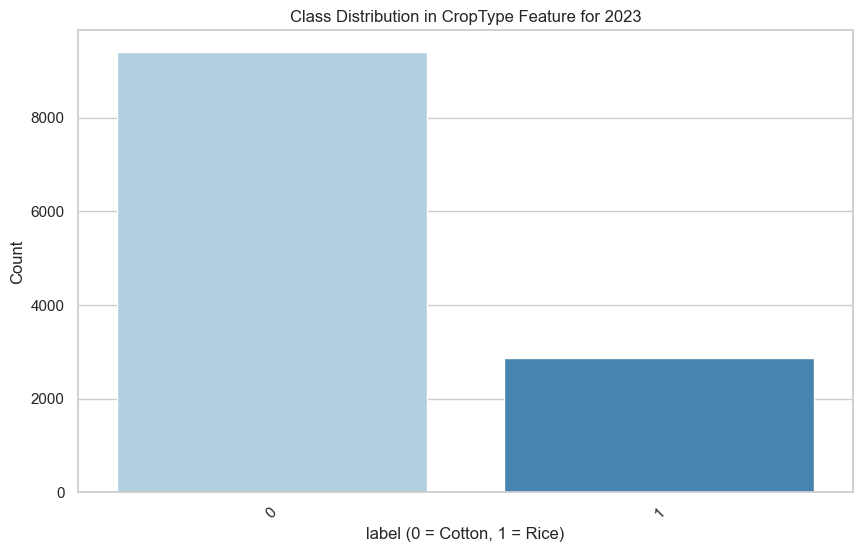

In [175]:
# Step 1: Set the style for the plot
sns.set(style="whitegrid")

# Plot the distribution of the target variable 'CropType' for each year
for year, data in zip([2021, 2022, 2023], [year_2021, year_2022, year_2023]):
    plt.figure(figsize=(10, 6))
    sns.countplot(data=data, x='label', palette='Blues')
    plt.title(f'Class Distribution in CropType Feature for {year}')
    plt.xlabel('label (0 = Cotton, 1 = Rice)')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

# 8. Download Datasets

The code creates a directory structure for saving preprocessed datasets. It first checks if the main directory (Preprocessed-Unsupervised) exists and creates it if not. Then, it organizes the datasets (for 2021, 2022, and 2023) into subdirectories based on categories (e.g., year_preprocessed). For each dataset, it saves the corresponding DataFrame as a CSV file within the appropriate subdirectory, ensuring that the files are well-organized. It also prints a confirmation message for each file saved.

In [176]:
# List of datasets
datasets = {
    "year_preprocessed": {
        "year2021preprocessed": year_2021,
        "year2022preprocessed": year_2022,
        "year2023preprocessed": year_2023,
    }
}

# Main directory
main_directory = "Preprocessed-Unsupervised"

# Create main directory if it doesn't exist
if not os.path.exists(main_directory):
    os.makedirs(main_directory)

# Save files in organized subdirectories
for category, files in datasets.items():
    category_dir = os.path.join(main_directory, category)  # e.g., Preprocessed-Unsupervised/cotton
    if not os.path.exists(category_dir):
        os.makedirs(category_dir)  # Create subdirectories 'cotton' and 'rice'

    for name, df in files.items():
        file_path = os.path.join(category_dir, f"{name}.csv")  # File path for each CSV
        df.to_csv(file_path, index=False)  # Save DataFrame as CSV
        print(f"Saved {name}.csv in {category_dir}")

Saved year2021preprocessed.csv in Preprocessed-Unsupervised\year_preprocessed
Saved year2022preprocessed.csv in Preprocessed-Unsupervised\year_preprocessed
Saved year2023preprocessed.csv in Preprocessed-Unsupervised\year_preprocessed


# 9. Unsupervised Model Implementation

The functions provided allow for the visualization and evaluation of clustering results. The visualize_with_pca function uses PCA to reduce data dimensions to 2D for visualizing predicted clusters and true labels. The plot_confusion_matrix function visualizes a confusion matrix using a heatmap, while the plot_silhouette_scores function calculates and plots silhouette scores to assess the quality of clustering. These visualizations help in interpreting clustering results and evaluating model performance.

In [177]:
# Function to visualize using PCA
def visualize_with_pca(X, y_true, y_pred, title="PCA Visualization of Clusters"):
    """
    Visualize clusters using PCA-reduced data.
    """
    # Apply PCA to reduce the data to 2 components for visualization
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # Create a DataFrame for visualization
    X_pca_df = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2'])
    X_pca_df['Predicted_Cluster'] = y_pred
    X_pca_df['True_Label'] = y_true

    plt.figure(figsize=(14, 6))

    # Plot predicted clusters
    plt.subplot(1, 2, 1)
    sns.scatterplot(data=X_pca_df, x='PCA1', y='PCA2', hue='Predicted_Cluster', palette='viridis', alpha=0.7)
    plt.title(f"{title} - Predicted Clusters")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.legend(title="Predicted Cluster", loc='best')

    # Plot true labels
    plt.subplot(1, 2, 2)
    sns.scatterplot(data=X_pca_df, x='PCA1', y='PCA2', hue='True_Label', palette='coolwarm', alpha=0.7)
    plt.title(f"{title} - True Labels")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.legend(title="True Label", loc='best')

    plt.tight_layout()
    plt.show()

# Function to plot the confusion matrix
def plot_confusion_matrix(conf_matrix, title="Confusion Matrix"):
    """
    Plot a confusion matrix using seaborn heatmap.
    """
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', cbar=False)
    plt.title(title)
    plt.xlabel("Predicted Cluster")
    plt.ylabel("True Cluster")
    plt.show()

# Function to plot silhouette scores
def plot_silhouette_scores(X, y_pred, title="Silhouette Score Visualization"):
    """
    Plot silhouette scores for the clustering.
    """
    silhouette_avg = silhouette_score(X, y_pred)
    print(f"Average Silhouette Score: {silhouette_avg:.4f}")

    plt.figure(figsize=(10, 6))
    sample_silhouette_values = silhouette_samples(X, y_pred)
    
    sns.histplot(sample_silhouette_values, bins=20, kde=True, color='skyblue')
    plt.title(f"{title} - Average Score: {silhouette_avg:.4f}")
    plt.xlabel("Silhouette Score")
    plt.ylabel("Frequency")
    plt.axvline(x=silhouette_avg, color='red', linestyle='--')
    plt.show()

# 10. K-Means Clustering

## 10.1. Simple Clustering

The code performs KMeans clustering on the data for each year, evaluates cluster purity, and visualizes the clustering results. It computes cluster purity using a contingency matrix, applies PCA to visualize the clusters, and plots a confusion matrix and silhouette scores for assessing clustering quality. For each year (2021, 2022, 2023), it prints the cluster purity and visualizes the clustering performance using various plots.

Clustering for Year 2021:


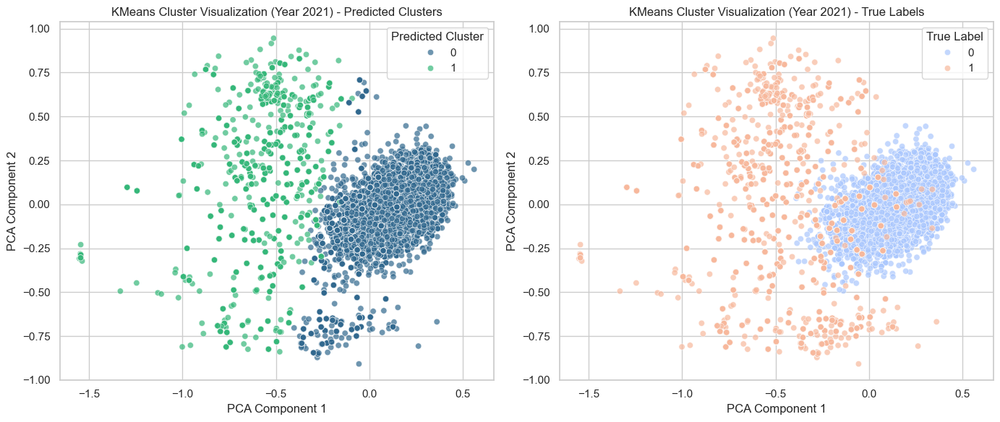

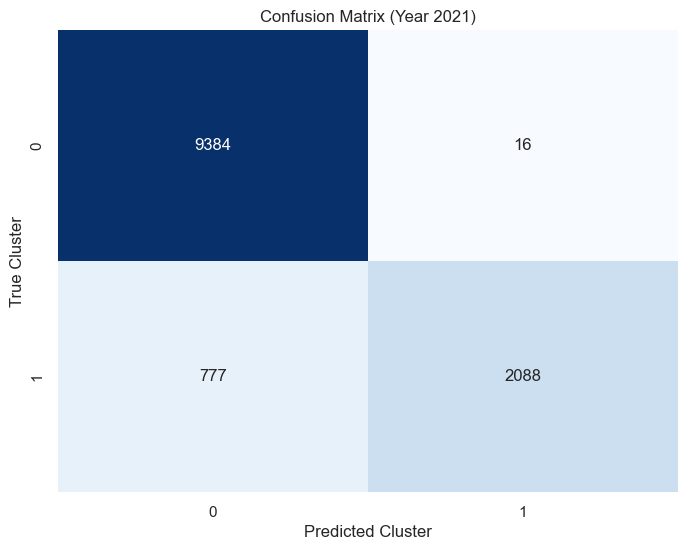

Average Silhouette Score: 0.4478


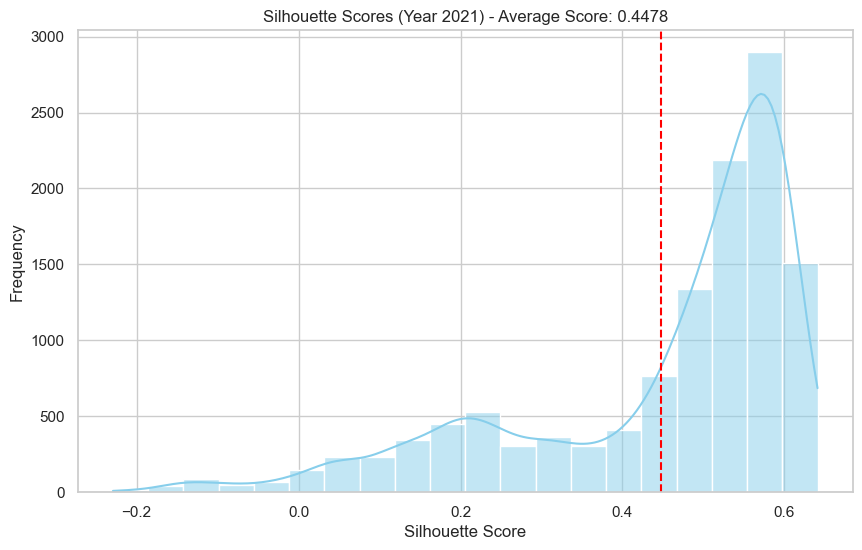

Cluster Purity for Year 2021: 0.9353
--------------------------------------------------
Clustering for Year 2022:


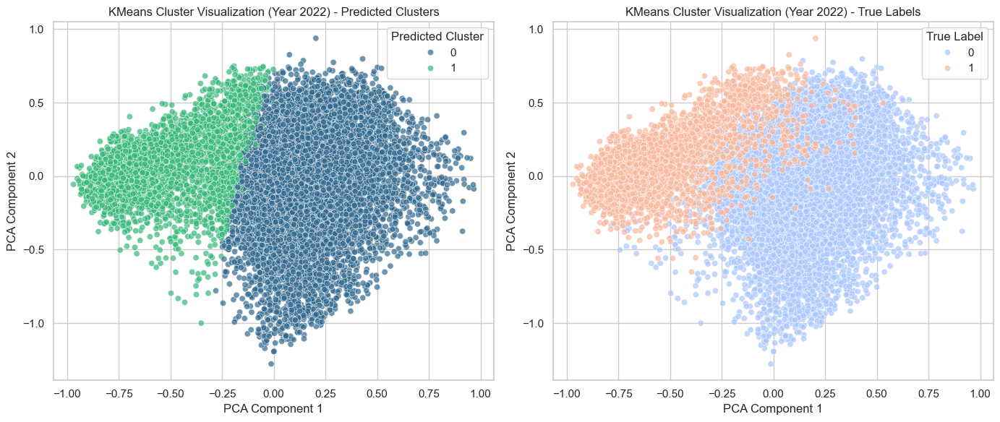

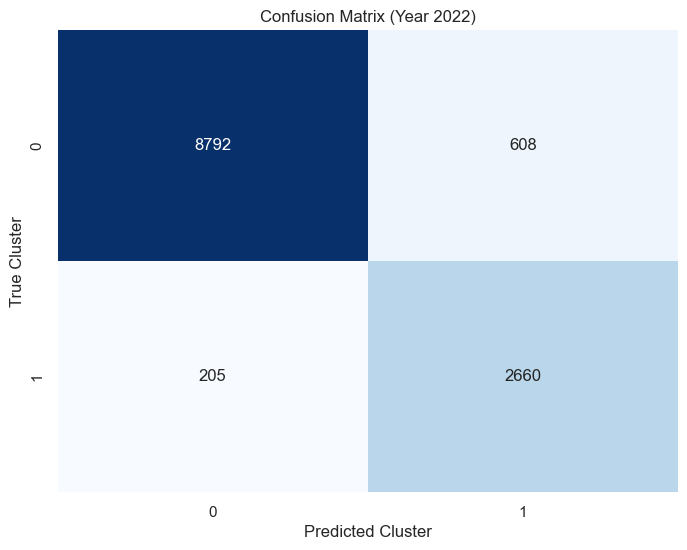

Average Silhouette Score: 0.2501


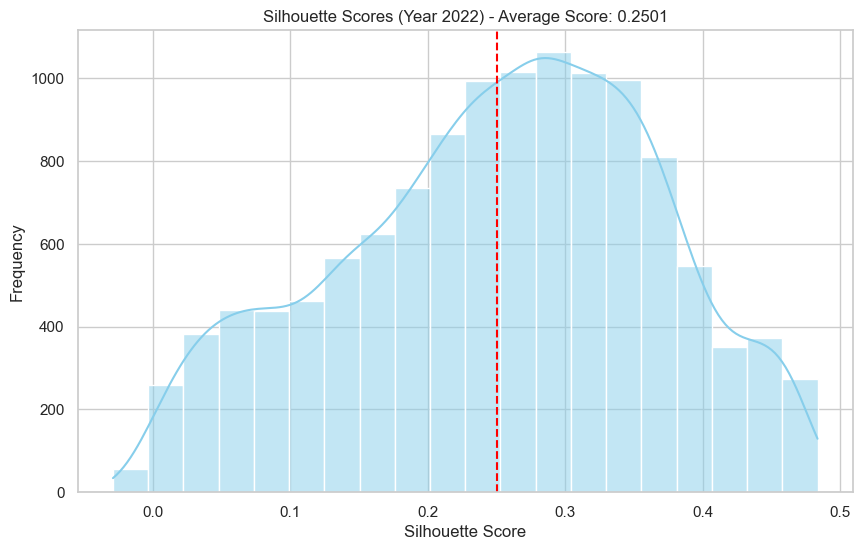

Cluster Purity for Year 2022: 0.9337
--------------------------------------------------
Clustering for Year 2023:


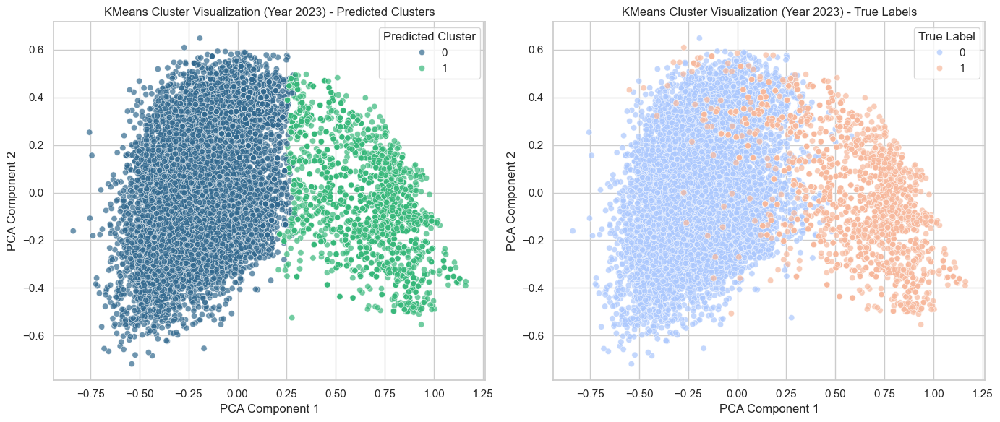

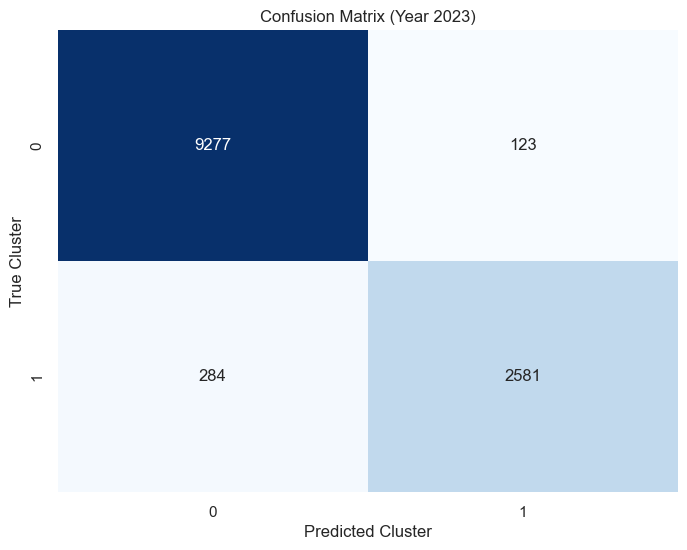

Average Silhouette Score: 0.3765


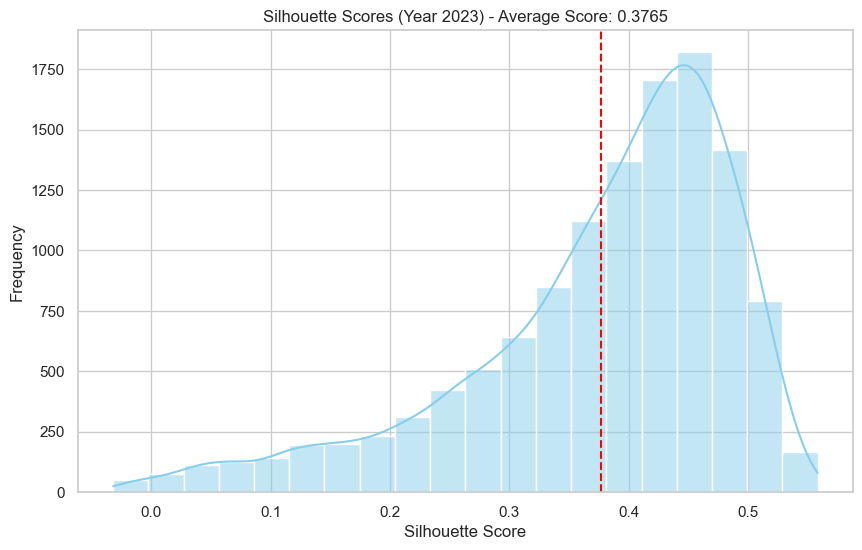

Cluster Purity for Year 2023: 0.9668
--------------------------------------------------


In [178]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
import matplotlib.pyplot as plt
import seaborn as sns

# Function to compute cluster purity
def calculate_cluster_purity(y_true, y_pred):
    """
    Calculate cluster purity.
    """
    contingency_matrix = confusion_matrix(y_true, y_pred)
    return np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

# Main clustering function
def perform_clustering(data, n_clusters=2, year="Year"):
    """
    Perform KMeans clustering, evaluate using cluster purity, and visualize clusters.
    """
    # Split features and labels
    X = data.drop(columns=['label'])
    y_true = data['label']

    # Fit KMeans
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    y_pred = kmeans.fit_predict(X)

    # Calculate cluster purity
    contingency_matrix = confusion_matrix(y_true, y_pred)
    purity = calculate_cluster_purity(y_true, y_pred)

    # Visualize combined clusters and true labels using PCA
    visualize_with_pca(X, y_true, y_pred, title=f"KMeans Cluster Visualization ({year})")

    # Visualize the confusion matrix with a heatmap
    plot_confusion_matrix(contingency_matrix, title=f"Confusion Matrix ({year})")

    # Plot silhouette scores
    plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")

    return purity, contingency_matrix

# Cluster each year's data separately
years_data = {
    '2021': year_2021,
    '2022': year_2022,
    '2023': year_2023
}

# Number of clusters (adjust based on domain knowledge or prior analysis)
n_clusters = 2

# Perform clustering on each year's data
for year, data in years_data.items():
    print(f"Clustering for Year {year}:")
    purity, conf_matrix = perform_clustering(data, n_clusters=n_clusters, year=f"Year {year}")
    print(f"Cluster Purity for Year {year}: {purity:.4f}")
    print("-" * 50)

## 10.2. Grid Search Clustering

In [179]:
!pip install kneed


The code performs KMeans clustering on datasets from 2021, 2022, and 2023, determining the best number of clusters for each year using the elbow method. It calculates cluster purity and visualizes the results using PCA, a confusion matrix, and silhouette scores. The optimal number of clusters is determined through the elbow method with the KneeLocator algorithm. For each year, it prints the cluster purity, optimal number of clusters, and visualizes the clustering results with relevant plots.

Clustering for Year 2021:


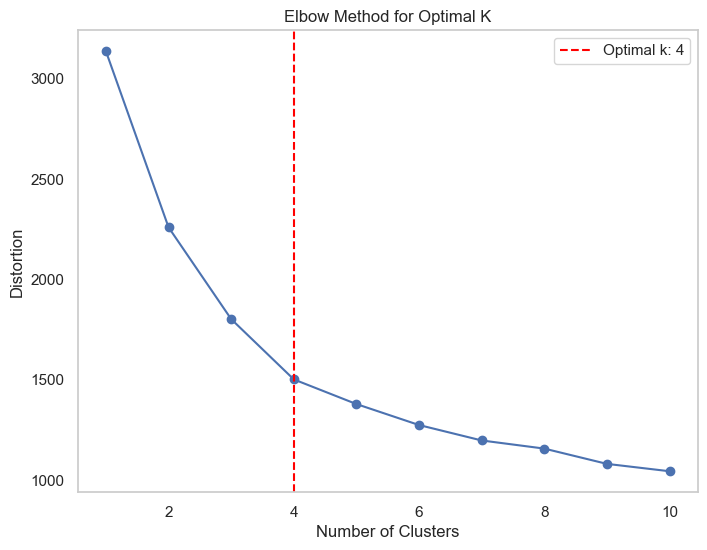

Optimal number of clusters for Year 2021: 4


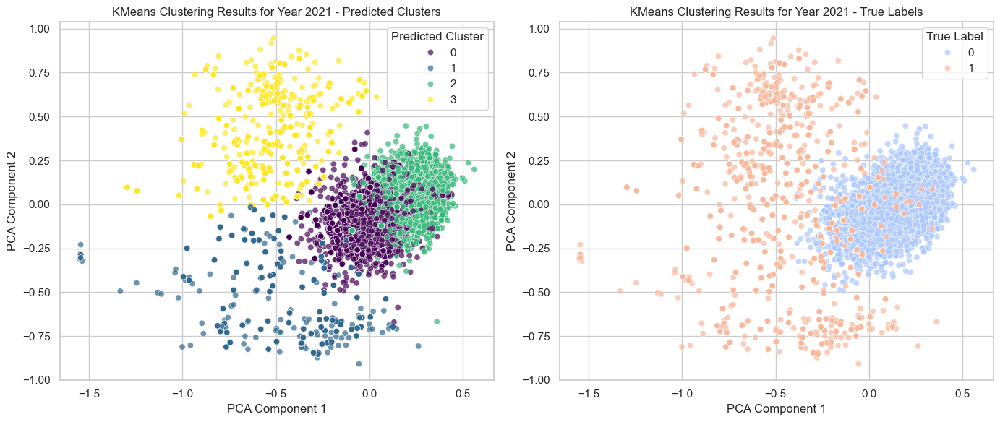

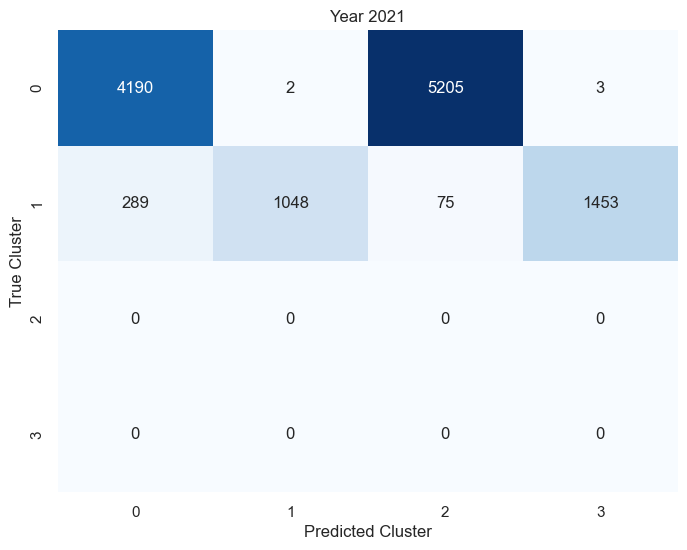

Average Silhouette Score: 0.2420


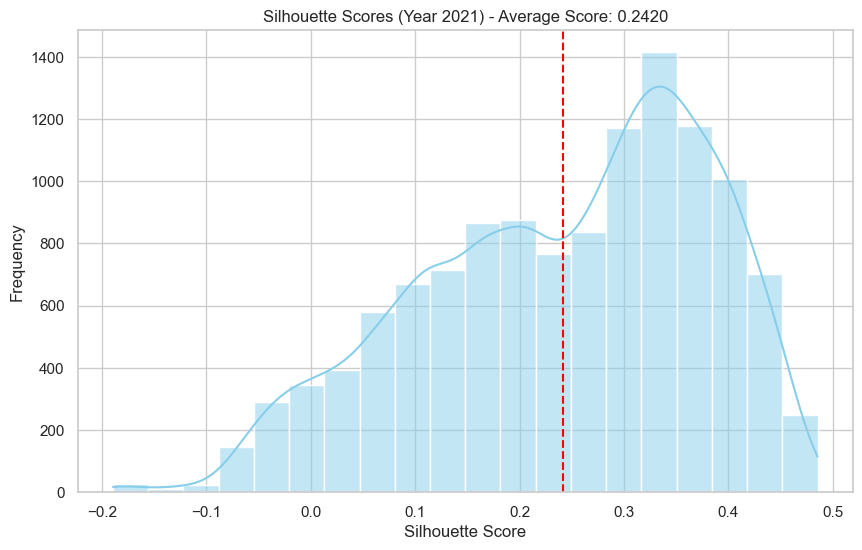

Cluster Purity for Year 2021: 0.9699
Optimal k for Year 2021: 4
--------------------------------------------------
Clustering for Year 2022:


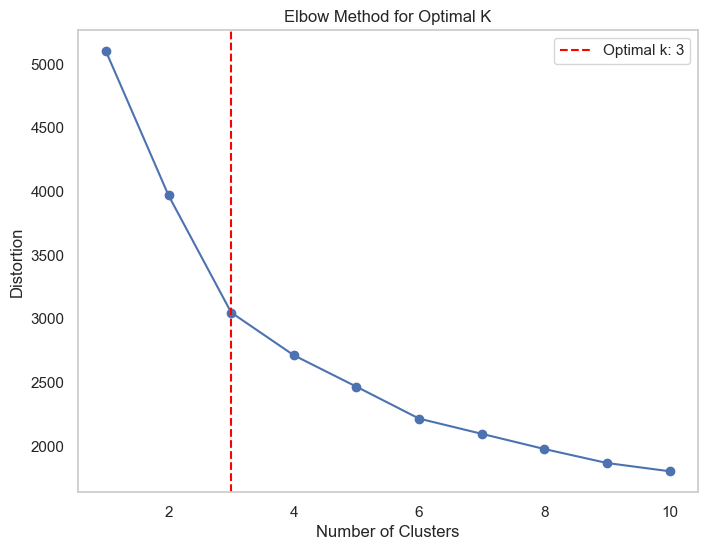

Optimal number of clusters for Year 2022: 3


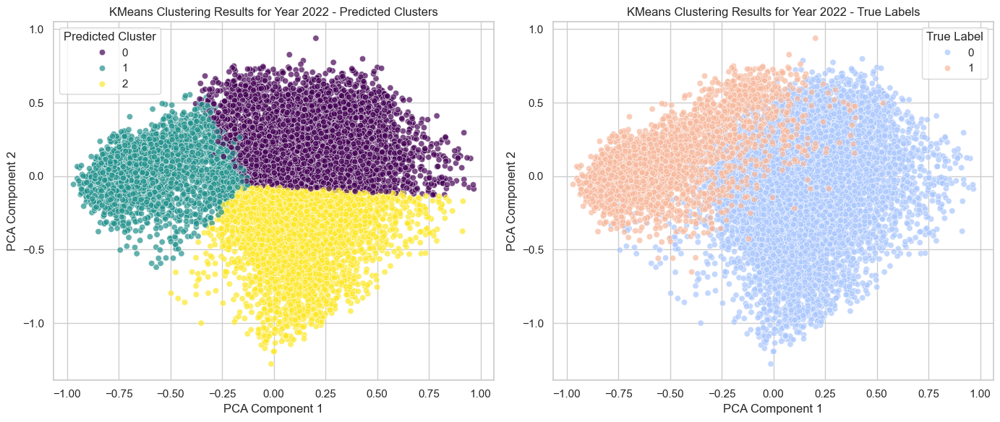

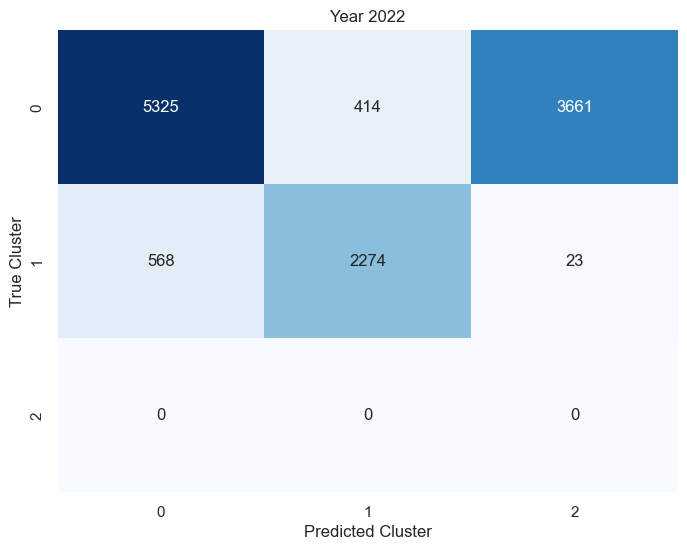

Average Silhouette Score: 0.2536


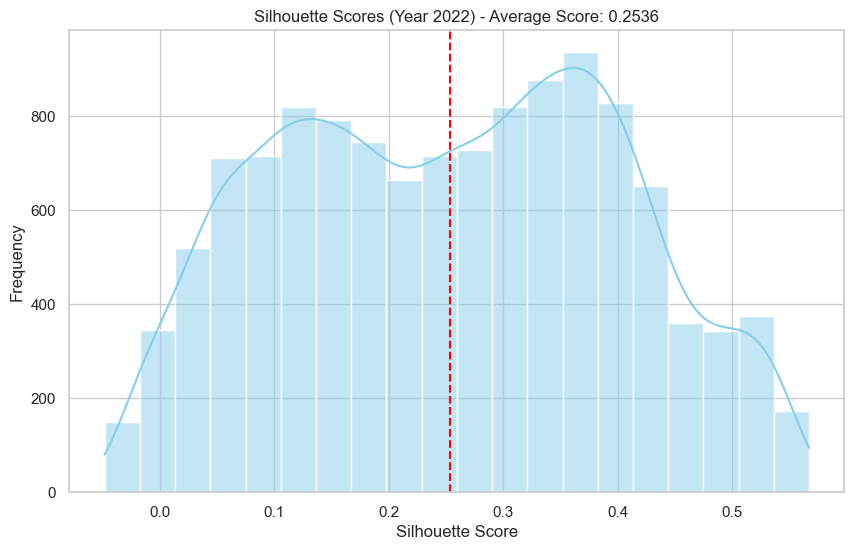

Cluster Purity for Year 2022: 0.9181
Optimal k for Year 2022: 3
--------------------------------------------------
Clustering for Year 2023:


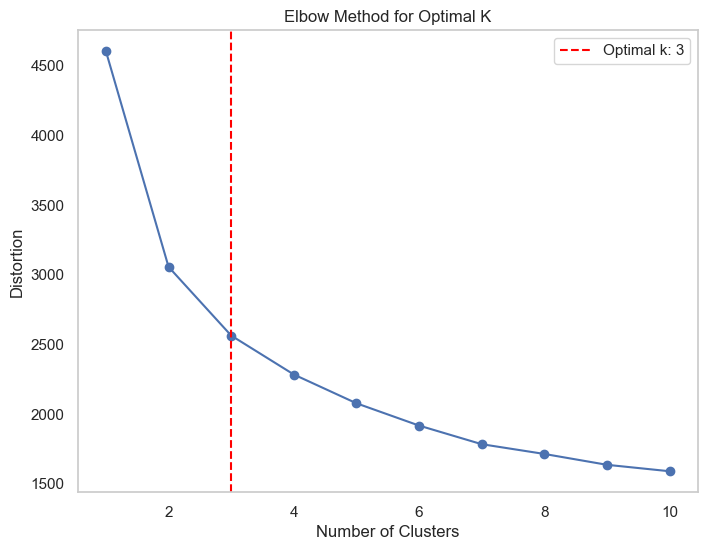

Optimal number of clusters for Year 2023: 3


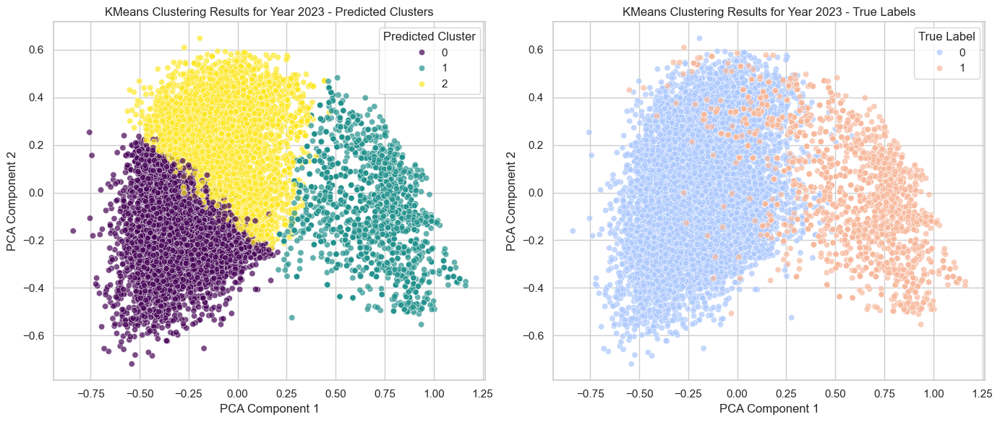

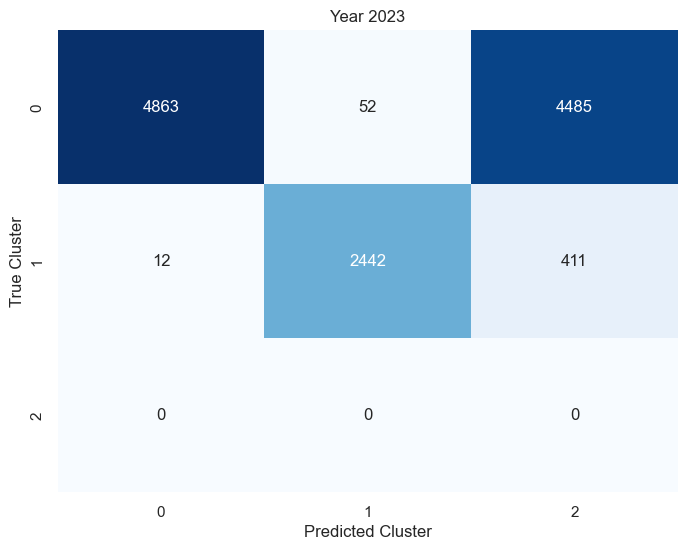

Average Silhouette Score: 0.2157


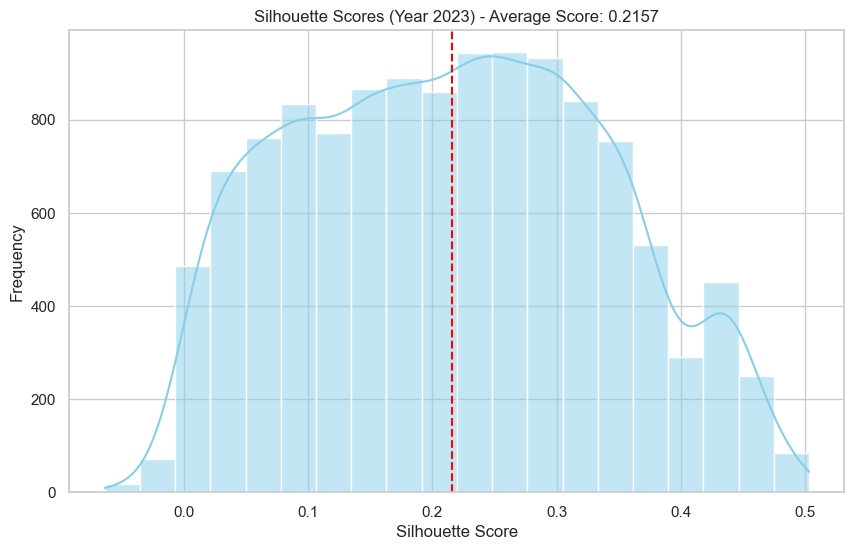

Cluster Purity for Year 2023: 0.9613
Optimal k for Year 2023: 3
--------------------------------------------------


In [180]:
# Function to compute cluster purity
def calculate_cluster_purity(y_true, y_pred):
    """
    Calculate cluster purity.
    """
    contingency_matrix = confusion_matrix(y_true, y_pred)
    return np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

# Function to determine the best number of clusters using the elbow method
def determine_best_k(X):
    """
    Use the elbow method to determine the optimal number of clusters.
    """
    distortions = []
    k_values = range(1, 11)
    for k in k_values:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X)
        distortions.append(kmeans.inertia_)

    # Use the knee locator to find the optimal k
    kneedle = KneeLocator(k_values, distortions, curve="convex", direction="decreasing")
    best_k = kneedle.knee

    # Plot the elbow graph
    plt.figure(figsize=(8, 6))
    plt.plot(k_values, distortions, marker='o')
    plt.axvline(best_k, color='red', linestyle='--', label=f"Optimal k: {best_k}")
    plt.title("Elbow Method for Optimal K")
    plt.xlabel("Number of Clusters")
    plt.ylabel("Distortion")
    plt.legend()
    plt.grid()
    plt.show()

    return best_k


# Main clustering function
def perform_clustering(data, year):
    """
    Perform KMeans clustering on the dataset for a specific year.
    """
    X = data.drop(columns=['label'])
    y = data['label']

    # Determine the best number of clusters
    best_k = determine_best_k(X)
    print(f"Optimal number of clusters for {year}: {best_k}")

    # Fit KMeans with the best k
    kmeans = KMeans(n_clusters=best_k, random_state=42)
    y_pred = kmeans.fit_predict(X)

    # Calculate cluster purity
    purity = calculate_cluster_purity(y, y_pred)

    # Visualize clusters and true labels using PCA
    visualize_with_pca(X, y, y_pred, title=f"KMeans Clustering Results for {year}")

    # Confusion matrix
    conf_matrix = confusion_matrix(y, y_pred)
    plot_confusion_matrix(conf_matrix, year)
    
    # Plot silhouette scores
    plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")

    return purity, best_k


# Apply clustering for each year
datasets = {
    "Year 2021": year_2021,
    "Year 2022": year_2022,
    "Year 2023": year_2023,
}

for year, data in datasets.items():
    print(f"Clustering for {year}:")
    purity, best_k = perform_clustering(data, year)
    print(f"Cluster Purity for {year}: {purity:.4f}")
    print(f"Optimal k for {year}: {best_k}")
    print("-" * 50)


# 11. Hierarchical Clustering

## 11.1. Simple Clustering

The code applies Agglomerative Clustering to datasets from 2021, 2022, and 2023, calculating cluster purity and visualizing the results. It uses PCA for dimensionality reduction, displays a confusion matrix, and evaluates clustering quality with silhouette scores.








Clustering for Year 2021:


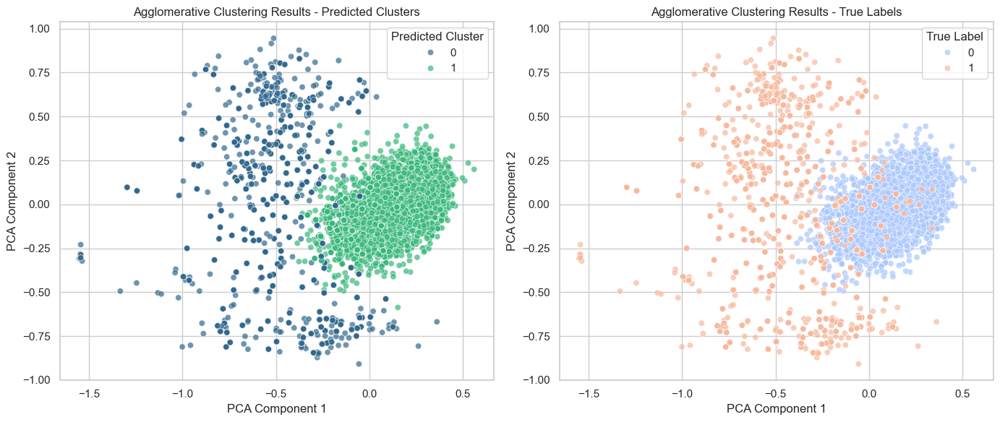

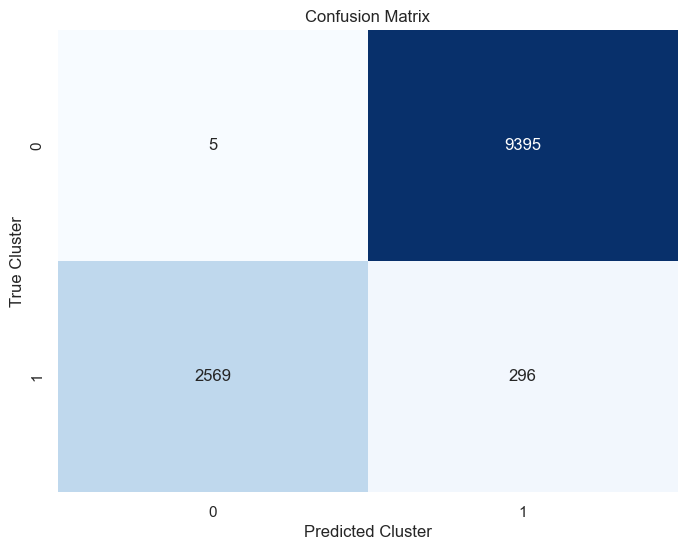

Average Silhouette Score: 0.4377


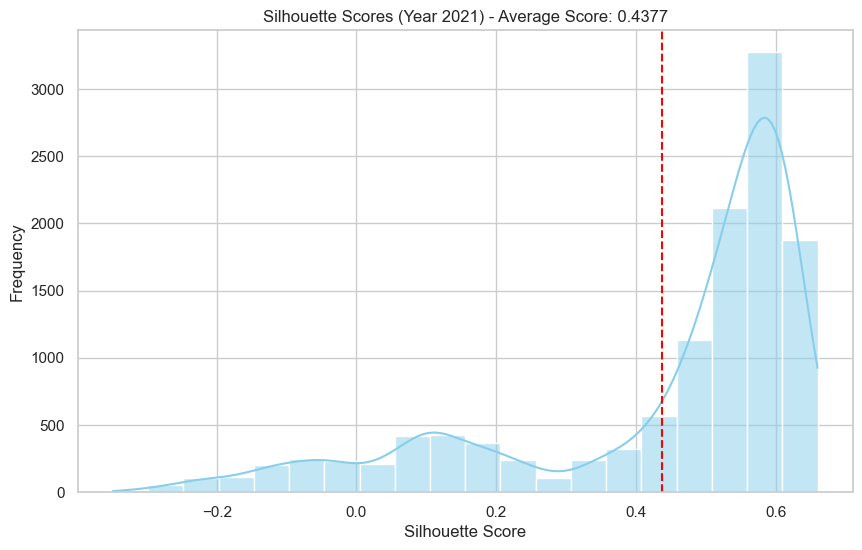

Cluster Purity for Year 2021: 0.9755
--------------------------------------------------
Clustering for Year 2022:


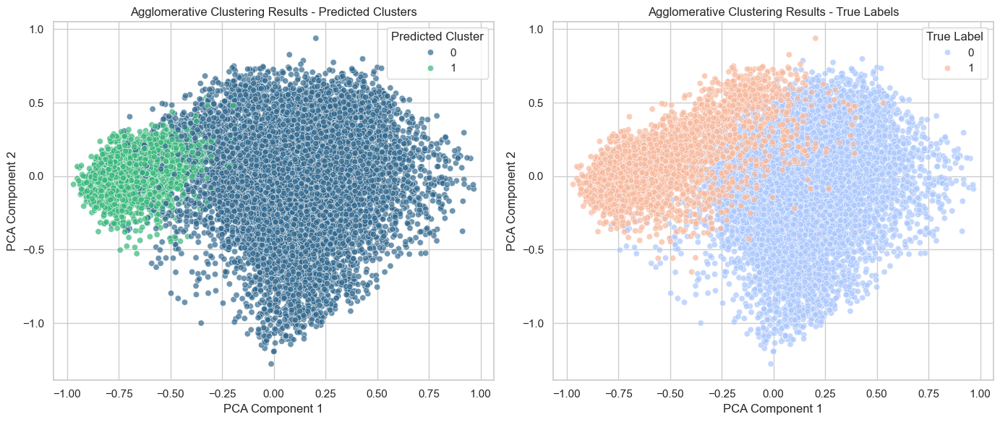

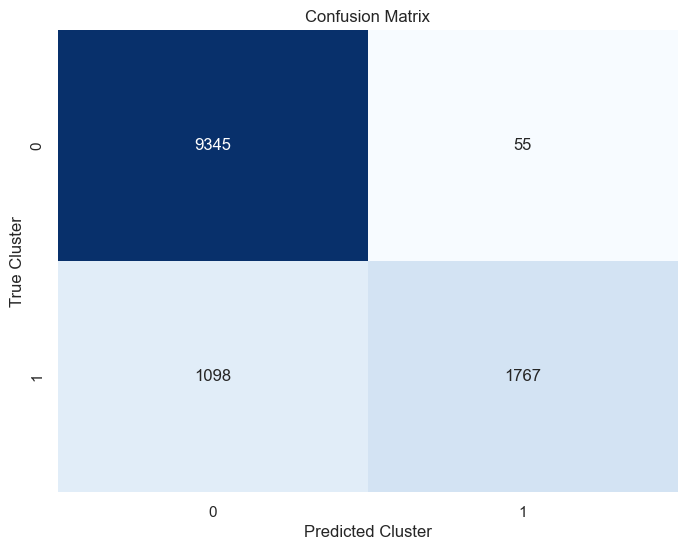

Average Silhouette Score: 0.2419


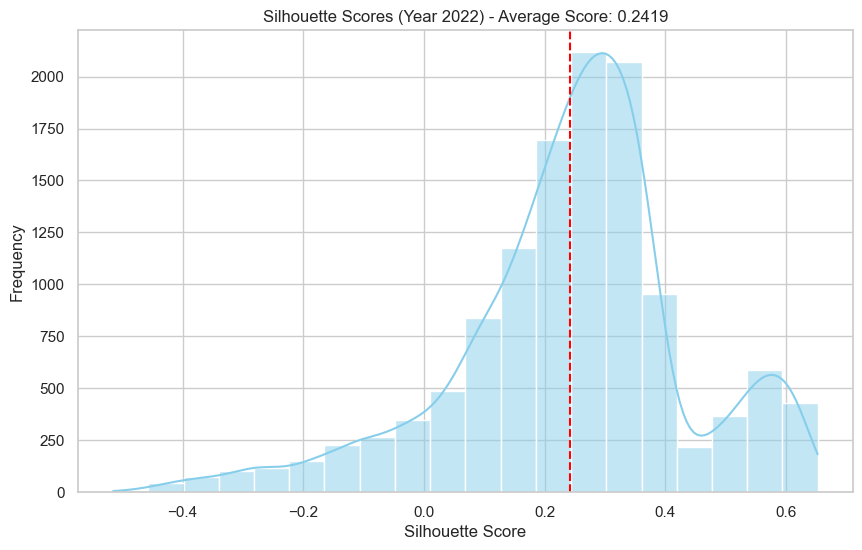

Cluster Purity for Year 2022: 0.9060
--------------------------------------------------
Clustering for Year 2023:


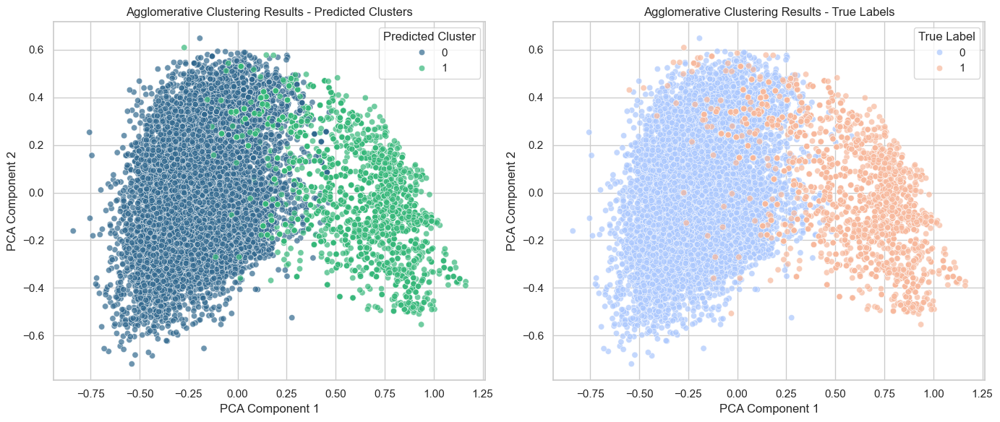

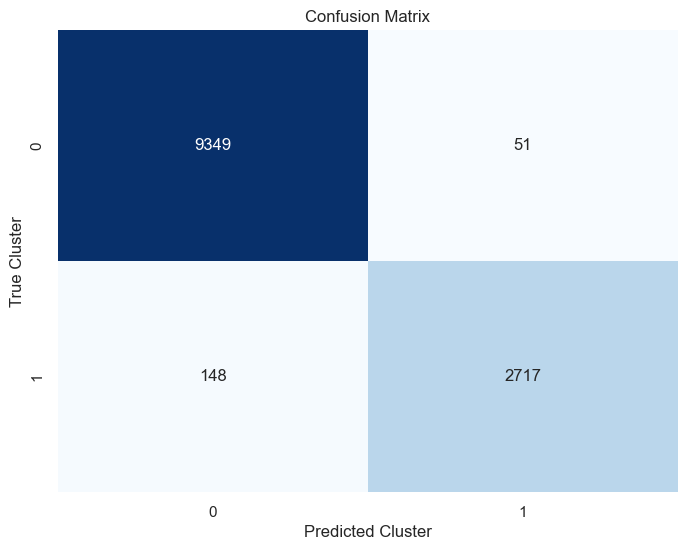

Average Silhouette Score: 0.3676


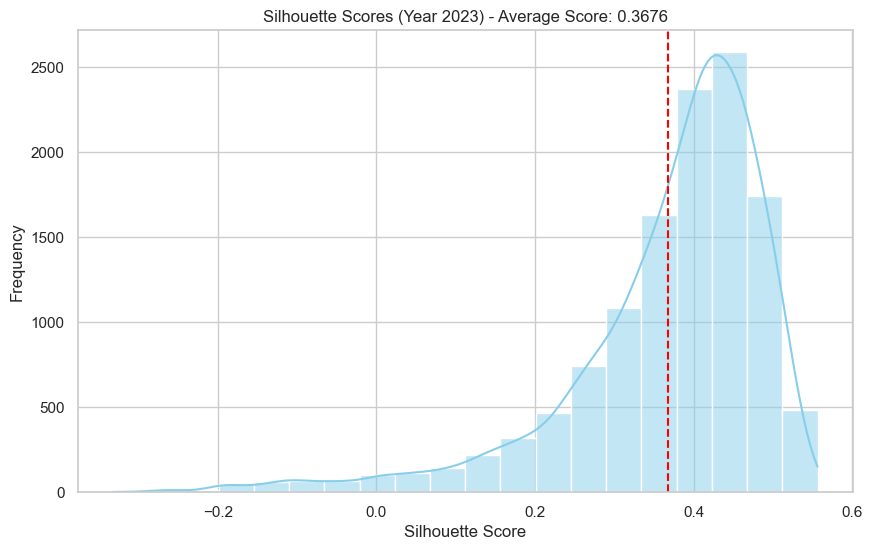

Cluster Purity for Year 2023: 0.9838
--------------------------------------------------


In [181]:
# Function to compute cluster purity
def calculate_cluster_purity(y_true, y_pred):
    """
    Calculate cluster purity.
    """
    contingency_matrix = confusion_matrix(y_true, y_pred)
    return np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

# Function to perform hierarchical clustering on a single dataset
def perform_clustering(data, n_clusters=2):
    """
    Perform hierarchical clustering on the dataset.
    """
    X = data.drop(columns=['label'])
    y = data['label']

    # Apply AgglomerativeClustering
    agglomerative = AgglomerativeClustering(n_clusters=n_clusters)
    y_pred = agglomerative.fit_predict(X)

    # Calculate cluster purity
    contingency_matrix = confusion_matrix(y, y_pred)
    purity = calculate_cluster_purity(y, y_pred)

    # Visualize clusters using PCA
    visualize_with_pca(X, y,y_pred, title="Agglomerative Clustering Results")

    # Plot confusion matrix
    plot_confusion_matrix(contingency_matrix)
    
    # Plot silhouette scores
    plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")

    return purity, contingency_matrix


# Cluster analysis for each year
datasets = {
    "Year 2021": year_2021,
    "Year 2022": year_2022,
    "Year 2023": year_2023,
}

n_clusters = 2  # Replace with your desired number of clusters

for year, data in datasets.items():
    print(f"Clustering for {year}:")
    purity, conf_matrix = perform_clustering(data, n_clusters=n_clusters)
    print(f"Cluster Purity for {year}: {purity:.4f}")
    print("-" * 50)


## 11.2. Grid Search Clustering

The code performs Agglomerative Clustering on datasets for the years 2021, 2022, and 2023, automatically determining the optimal number of clusters using a dendrogram and silhouette score. It calculates cluster purity using the Hungarian algorithm for label alignment and visualizes the results with PCA, confusion matrix, and silhouette scores.

Clustering for Year 2021:


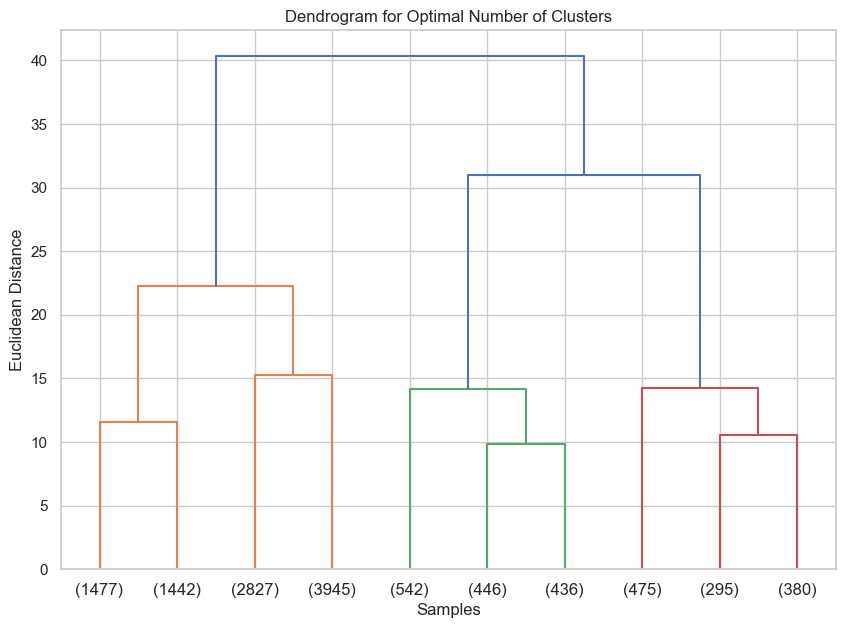

Automatically selected number of clusters: 3 with Silhouette Score: 0.4582


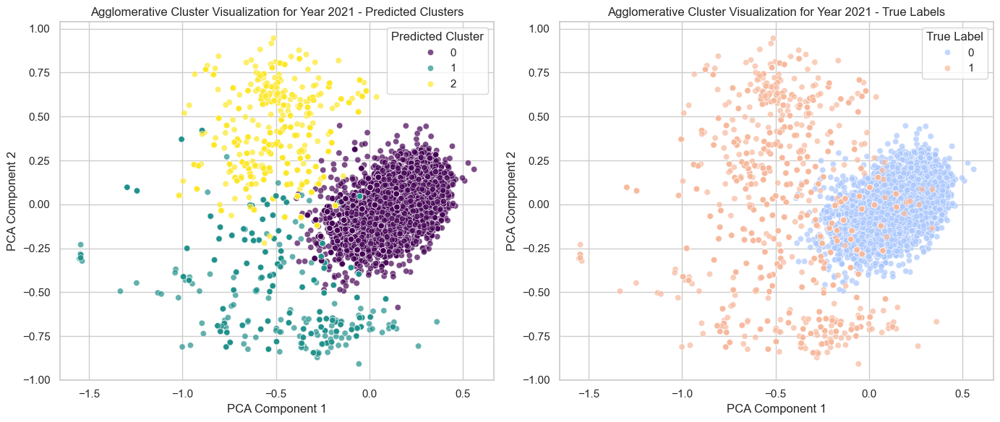

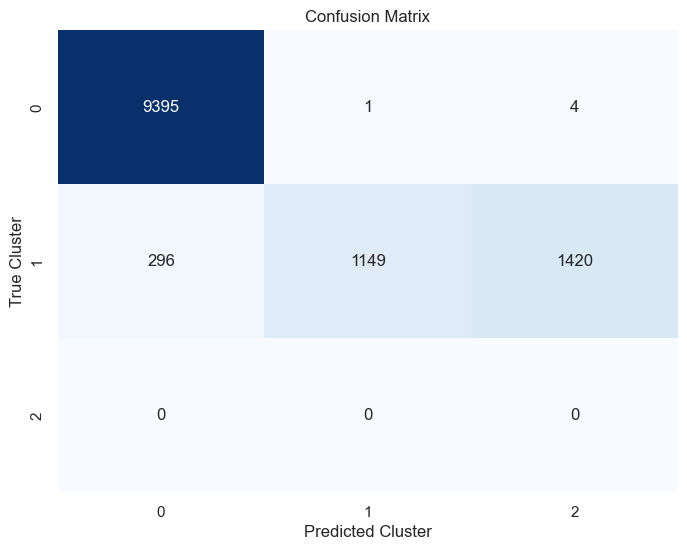

Average Silhouette Score: 0.4582


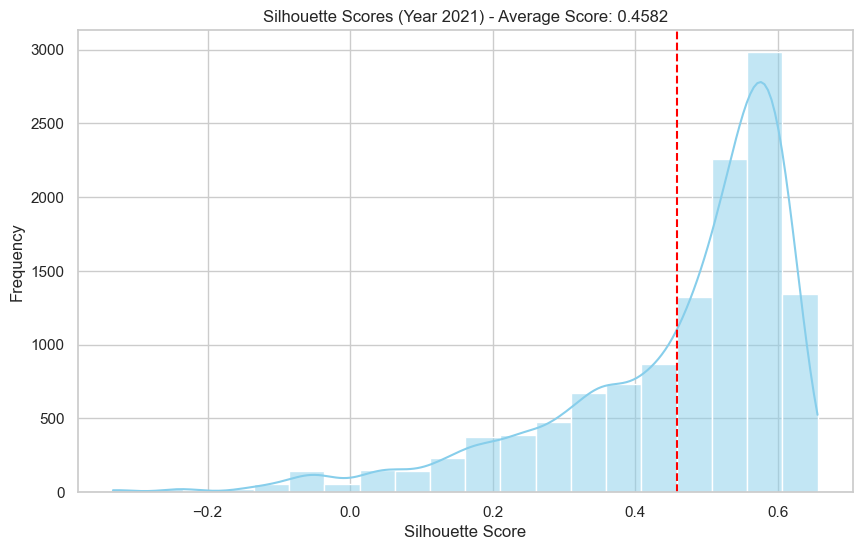

Cluster Purity for Year 2021: 0.8818
--------------------------------------------------
Clustering for Year 2022:


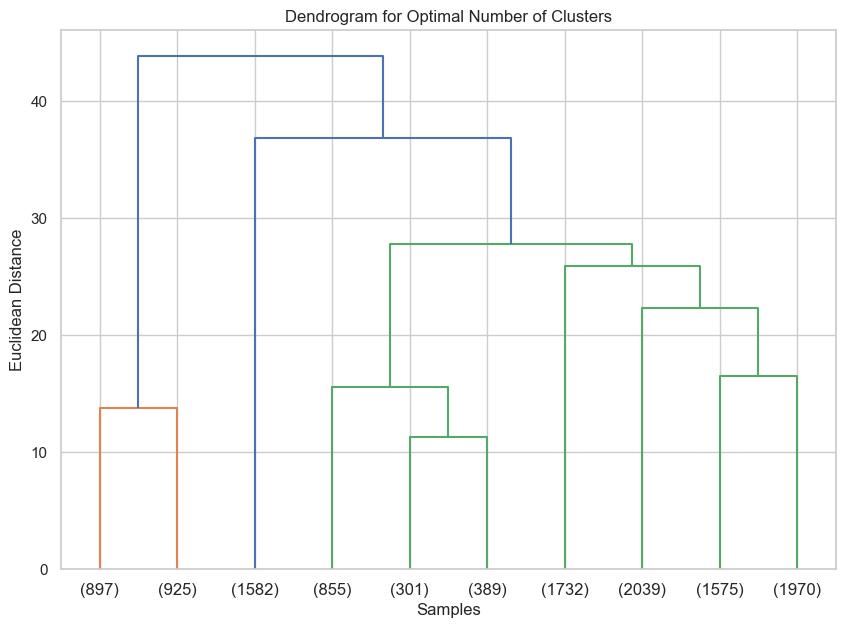

Automatically selected number of clusters: 2 with Silhouette Score: 0.2419


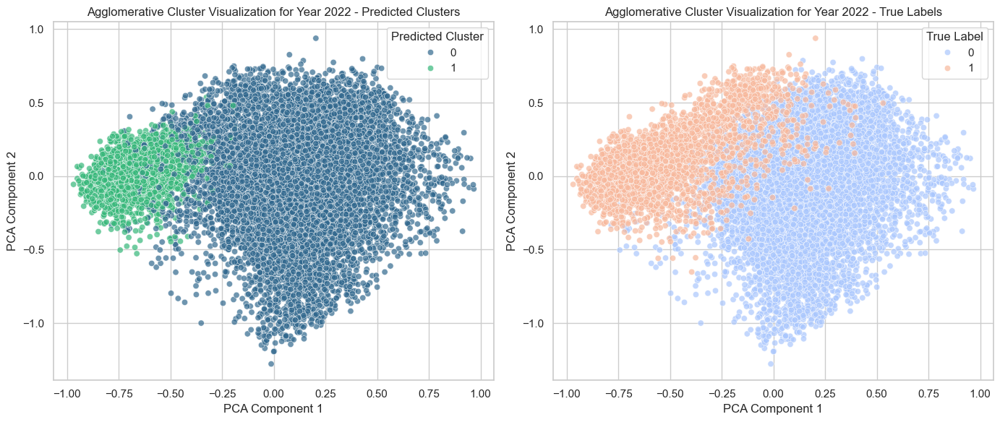

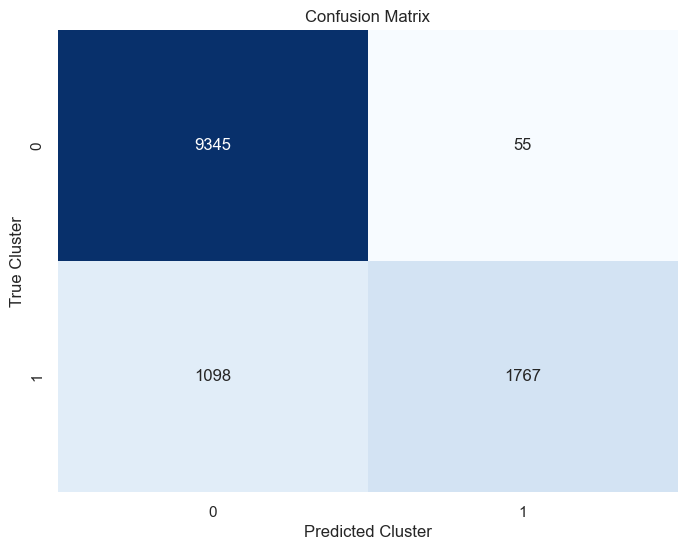

Average Silhouette Score: 0.2419


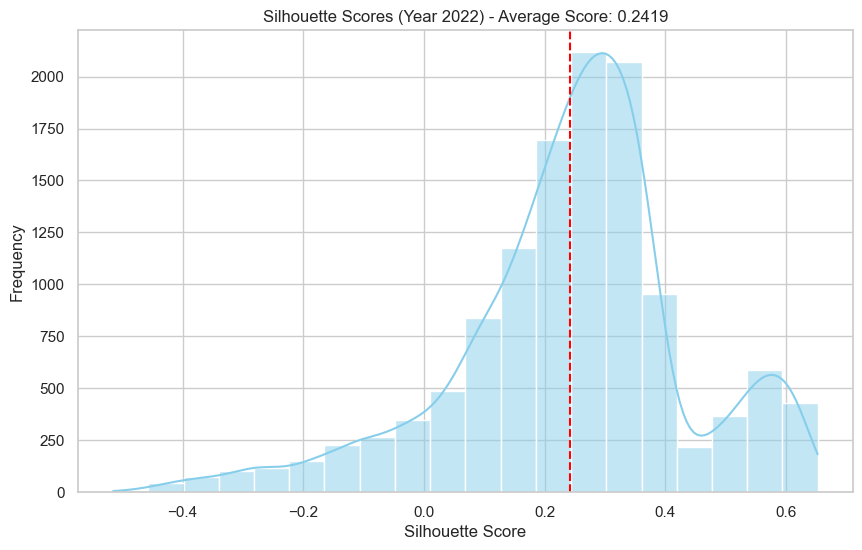

Cluster Purity for Year 2022: 0.9060
--------------------------------------------------
Clustering for Year 2023:


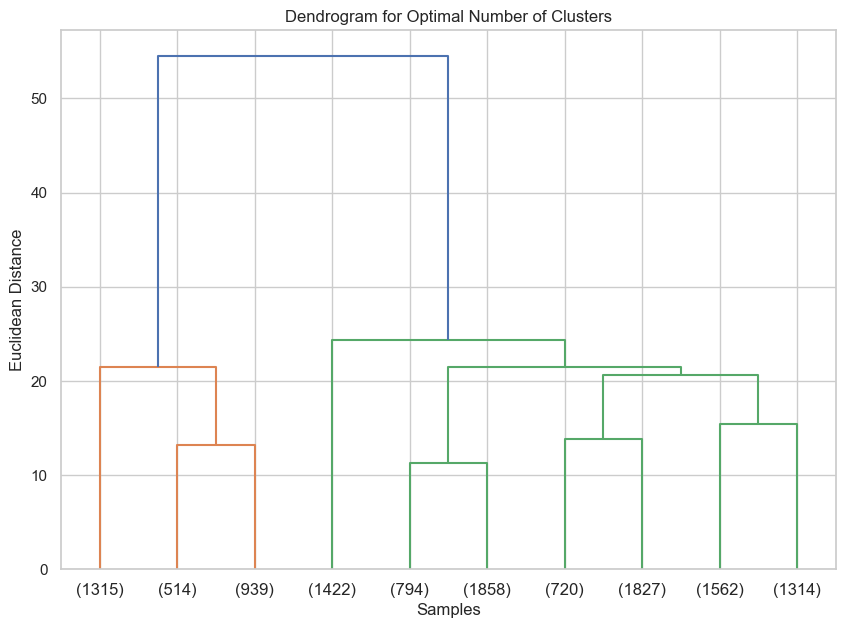

Automatically selected number of clusters: 2 with Silhouette Score: 0.3676


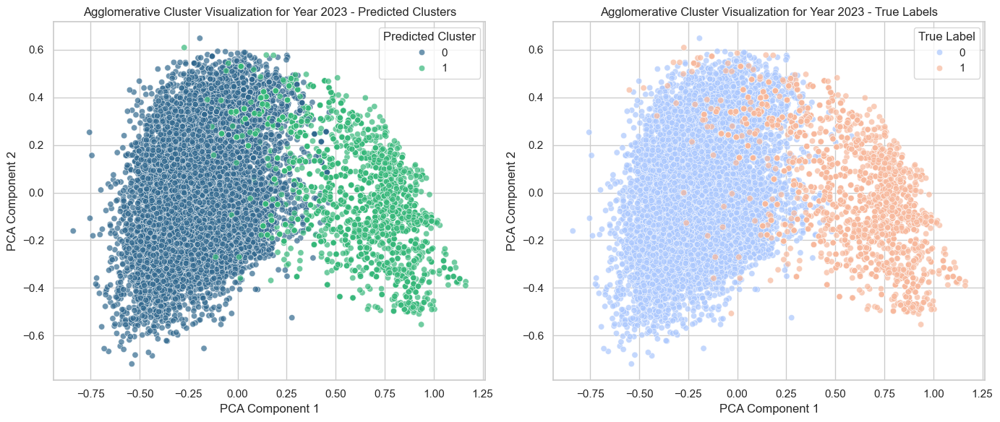

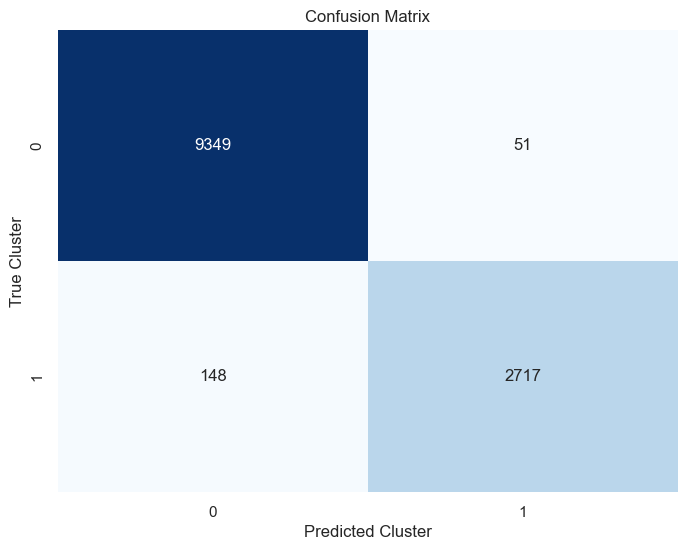

Average Silhouette Score: 0.3676


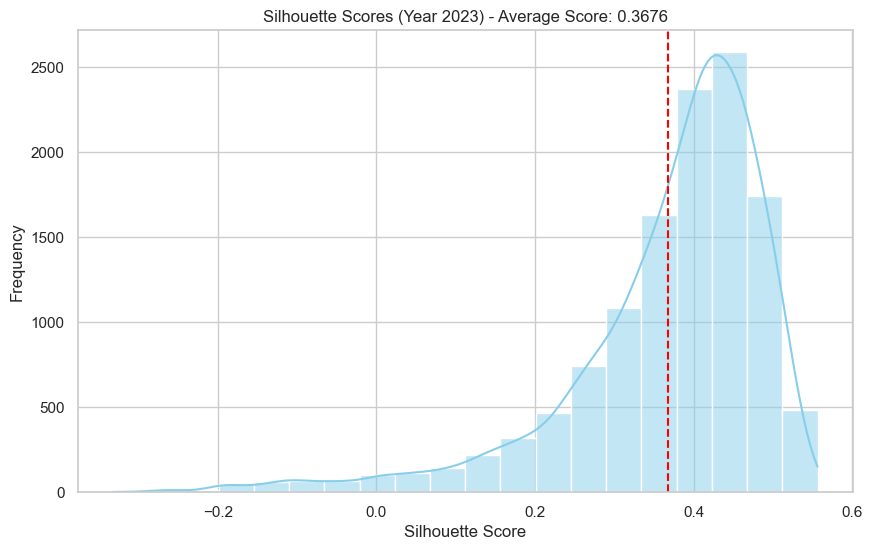

Cluster Purity for Year 2023: 0.9838
--------------------------------------------------


In [182]:
# Function to compute cluster purity with Hungarian algorithm for label alignment
def calculate_cluster_purity(y_true, y_pred):
    """
    Calculate cluster purity with Hungarian algorithm for label alignment.
    """
    contingency_matrix = confusion_matrix(y_true, y_pred)
    row_ind, col_ind = linear_sum_assignment(-contingency_matrix)
    max_sum = contingency_matrix[row_ind, col_ind].sum()
    return max_sum / np.sum(contingency_matrix)

# Function to visualize dendrogram and determine clusters programmatically
def plot_dendrogram(X, max_clusters=10):
    """
    Plot the dendrogram and automatically determine the optimal number of clusters.
    """
    linkage_matrix = linkage(X, method='ward')
    
    # Create the dendrogram
    plt.figure(figsize=(10, 7))
    dendrogram(linkage_matrix, truncate_mode='lastp', p=max_clusters, show_leaf_counts=True)
    plt.title("Dendrogram for Optimal Number of Clusters")
    plt.xlabel("Samples")
    plt.ylabel("Euclidean Distance")
    plt.show()

    # Automatically determine the optimal number of clusters using silhouette score
    best_silhouette_score = -1
    optimal_clusters = 2  # Start with a minimum of 2 clusters
    for n_clusters in range(2, max_clusters + 1):
        cluster_labels = cut_tree(linkage_matrix, n_clusters=n_clusters).flatten()
        silhouette_avg = silhouette_score(X, cluster_labels)
        if silhouette_avg > best_silhouette_score:
            best_silhouette_score = silhouette_avg
            optimal_clusters = n_clusters

    print(f"Automatically selected number of clusters: {optimal_clusters} with Silhouette Score: {best_silhouette_score:.4f}")
    
    # Cut the tree at the optimal number of clusters
    cluster_labels = cut_tree(linkage_matrix, n_clusters=optimal_clusters)
    return cluster_labels.flatten(), optimal_clusters

# Perform hierarchical clustering
def perform_clustering(data, year):
    """
    Perform Agglomerative Clustering, evaluate using cluster purity, and visualize clusters with PCA.
    """
    X = data.drop(columns=['label'])
    y = data['label']

    # Find optimal number of clusters from dendrogram
    cluster_labels, optimal_clusters = plot_dendrogram(X)
    
    # Fit AgglomerativeClustering with the optimal number of clusters
    agglomerative = AgglomerativeClustering(n_clusters=optimal_clusters)
    y_pred = agglomerative.fit_predict(X)

    # Calculate cluster purity
    purity = calculate_cluster_purity(y, y_pred)

    # Visualize clusters using PCA
    visualize_with_pca(X,  y,y_pred, title=f"Agglomerative Cluster Visualization for {year}")

    # Visualize the confusion matrix with a heatmap
    conf_matrix = confusion_matrix(y, y_pred)
    plot_confusion_matrix(conf_matrix)
    
    # Plot silhouette scores
    plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")

    return purity, conf_matrix


# Apply clustering for each year individually
datasets = {
    "Year 2021": year_2021,
    "Year 2022": year_2022,
    "Year 2023": year_2023,
}

for year, data in datasets.items():
    print(f"Clustering for {year}:")

    # Perform clustering for the year
    purity, conf_matrix = perform_clustering(data, year)
    print(f"Cluster Purity for {year}: {purity:.4f}")
    print("-" * 50)


# 12. DB SCAN

## 12.1. Simple Clustering

The provided code performs DBSCAN clustering on datasets for the years 2021, 2022, and 2023. It evaluates the clustering results using cluster purity, computed from the contingency matrix, and visualizes the clusters using PCA. Additionally, it filters out noise points, ensuring valid clusters are considered for purity and confusion matrix calculation. The code also plots silhouette scores, confusion matrices, and visualizes the clustering results. If no valid clusters are found, purity is set to 0.0.

Clustering for Year 2021:


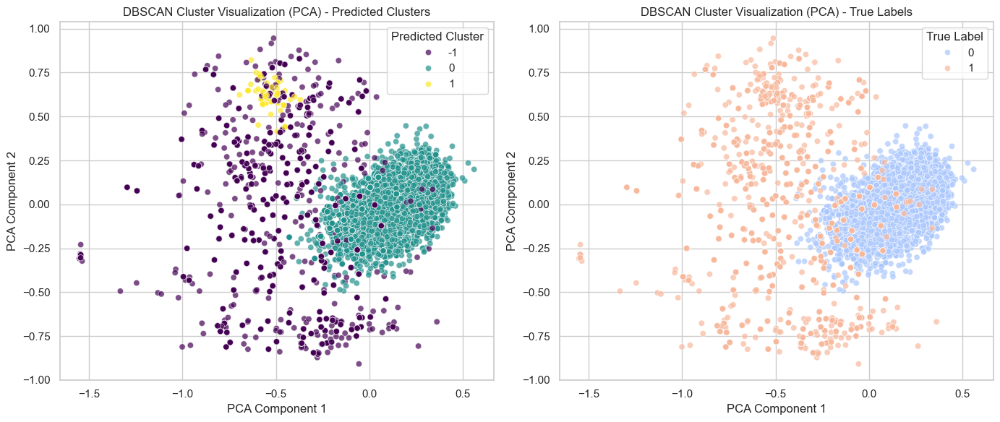

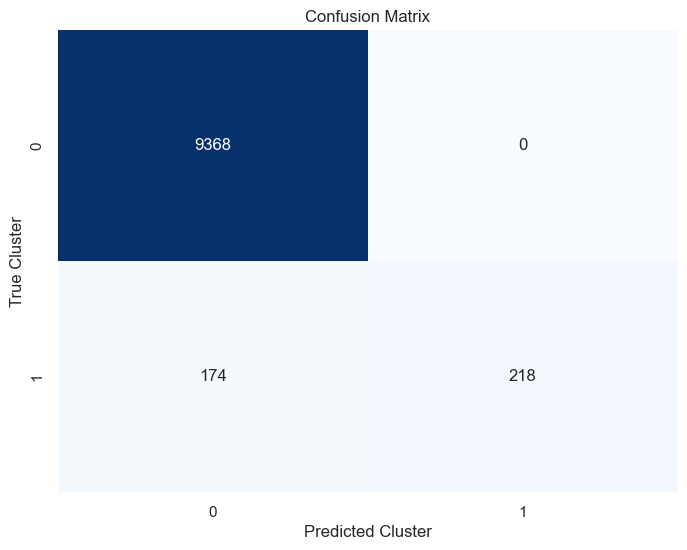

Average Silhouette Score: 0.4101


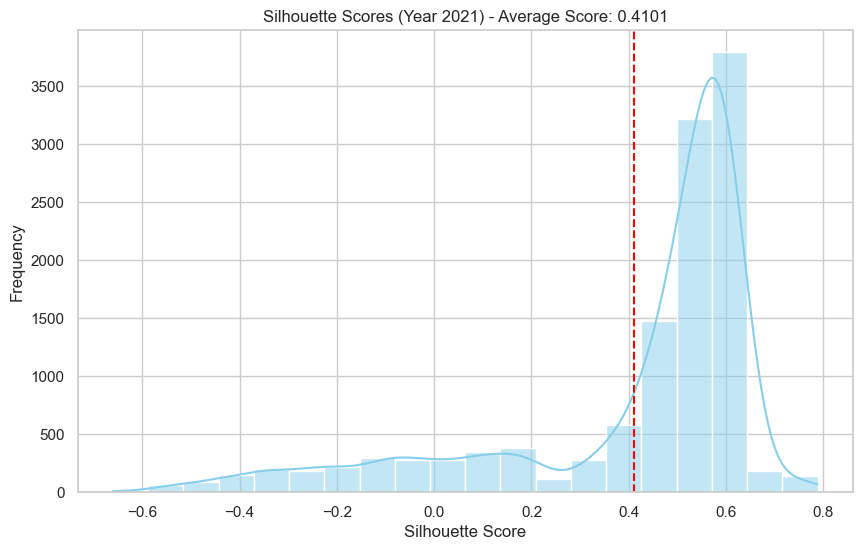

Cluster Purity for Year 2021: 0.9822
--------------------------------------------------
Clustering for Year 2022:


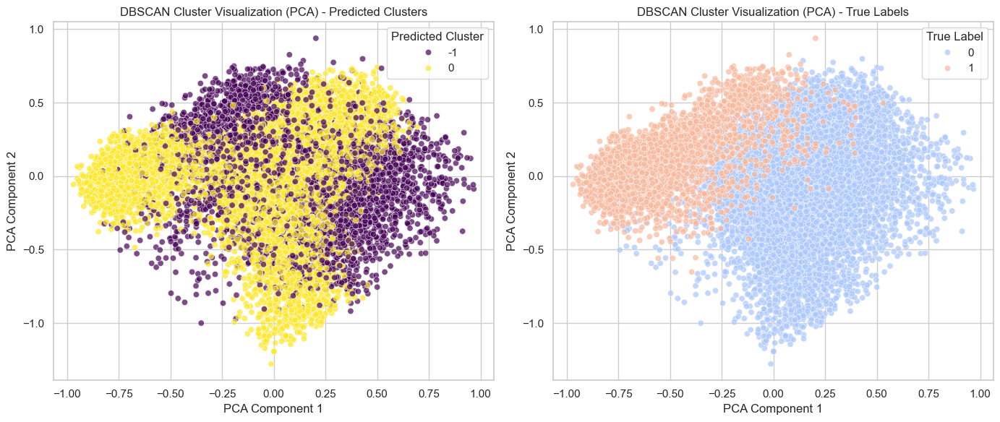

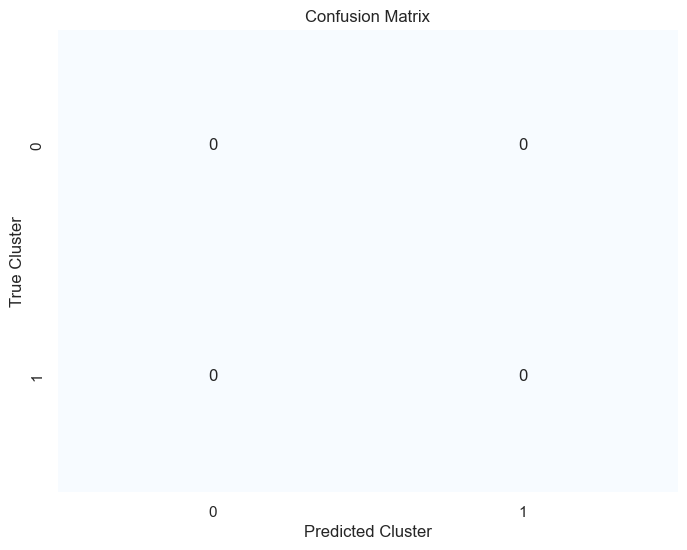

Average Silhouette Score: 0.0907


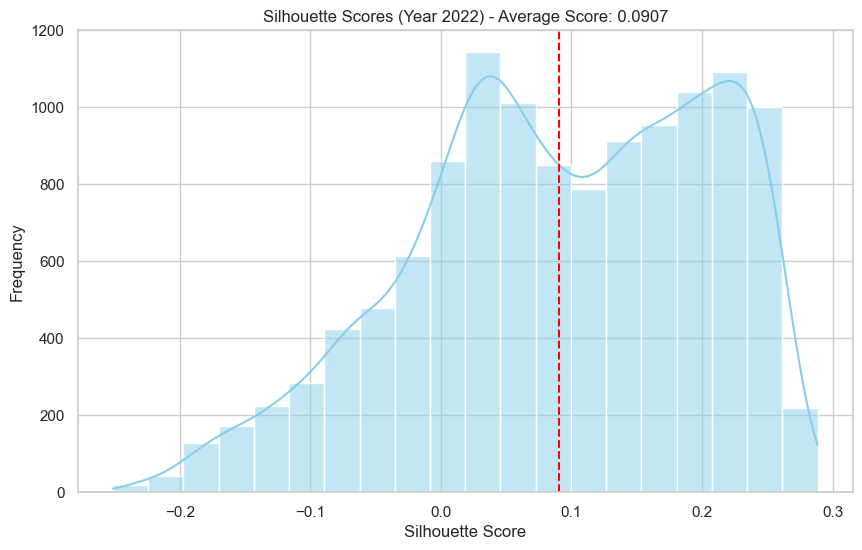

Cluster Purity for Year 2022: 0.0000
--------------------------------------------------
Clustering for Year 2023:


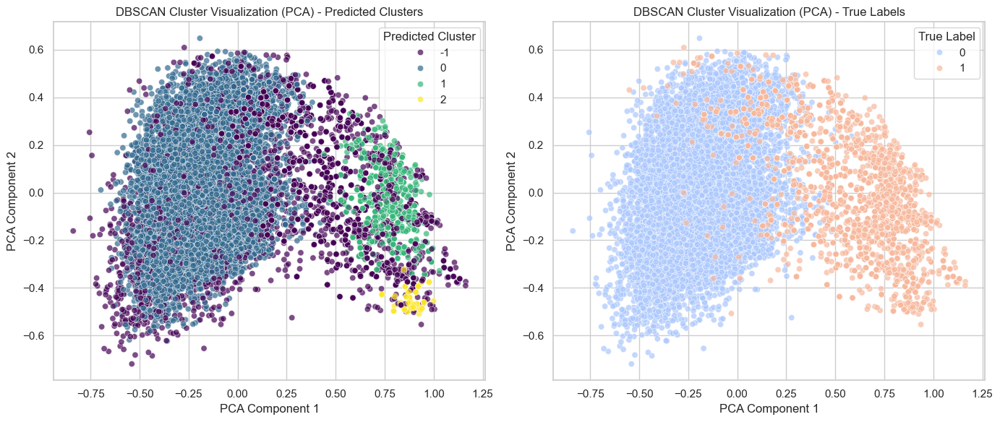

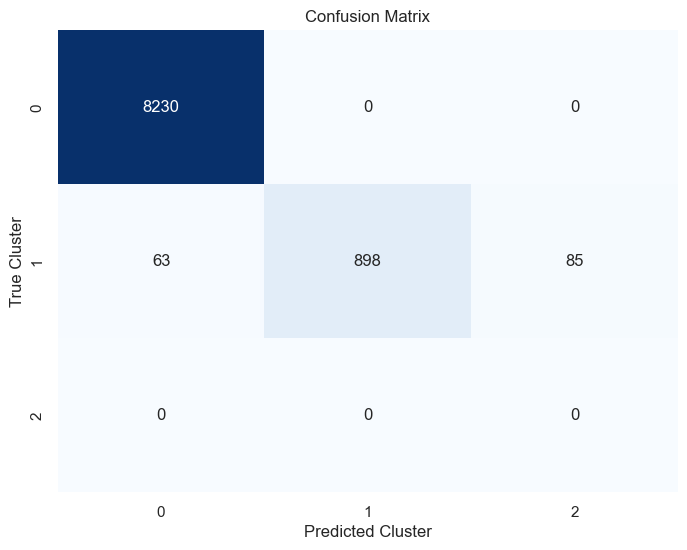

Average Silhouette Score: 0.2001


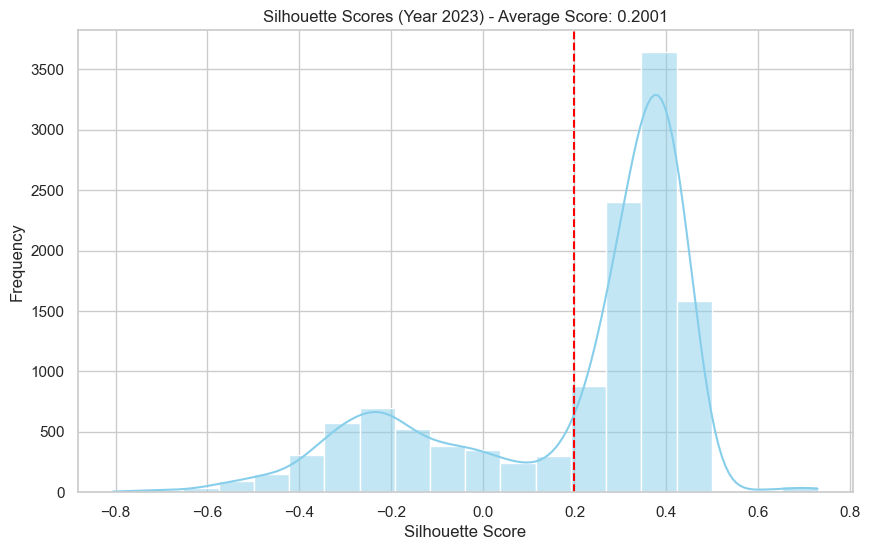

Cluster Purity for Year 2023: 0.9932
--------------------------------------------------


In [183]:
# Function to compute cluster purity
def calculate_cluster_purity(y_true, y_pred):
    """
    Calculate cluster purity.
    """
    contingency_matrix = confusion_matrix(y_true, y_pred)
    return np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

def perform_clustering(data, eps=0.27, min_samples=102):
    """
    Perform DBSCAN clustering, evaluate using cluster purity, and visualize clusters using PCA.
    """
    # Split features and labels
    X = data.drop(columns=['label'])
    y = data['label']

    # Fit DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    dbscan.fit(X)

    # Predict clusters for the data
    y_pred = dbscan.labels_

    # Filter out noise points (-1) for purity and confusion matrix calculation
    valid_indices = y_pred != -1
    y_valid = y[valid_indices]
    y_pred_valid = y_pred[valid_indices]

    # Calculate cluster purity if valid clusters exist
    if len(np.unique(y_pred_valid)) > 1:  # Ensure valid clusters exist
        contingency_matrix = confusion_matrix(y_valid, y_pred_valid)
        purity = calculate_cluster_purity(y_valid, y_pred_valid)
    else:
        contingency_matrix = np.zeros((len(np.unique(y)), len(np.unique(y))))  # Empty matrix, no valid clusters
        purity = 0.0  # No valid clusters, purity is 0.0

    # Visualize clusters using PCA
    visualize_with_pca(X, y, y_pred, title="DBSCAN Cluster Visualization (PCA)")

    # Visualize the confusion matrix with a heatmap
    plot_confusion_matrix(contingency_matrix)
    
    # Plot silhouette scores
    plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")

    return purity, contingency_matrix


# Datasets for the years 2021, 2022, and 2023
datasets = {
    "Year 2021": year_2021,
    "Year 2022": year_2022,
    "Year 2023": year_2023,
}

# Perform clustering for each year independently
for year, data in datasets.items():
    print(f"Clustering for {year}:")

    # Perform clustering for the year
    purity, conf_matrix = perform_clustering(data, eps=0.27, min_samples=102)
    print(f"Cluster Purity for {year}: {purity:.4f}")
    print("-" * 50)


## 12.2. Grid Search Clustering

The code performs DBSCAN clustering with grid search over eps and min_samples values for each dataset (2021, 2022, and 2023), evaluating the best clustering configuration based on cluster purity. It visualizes the best clusters using PCA, plots confusion matrices, and silhouette scores for each year.








Clustering for Year 2021:


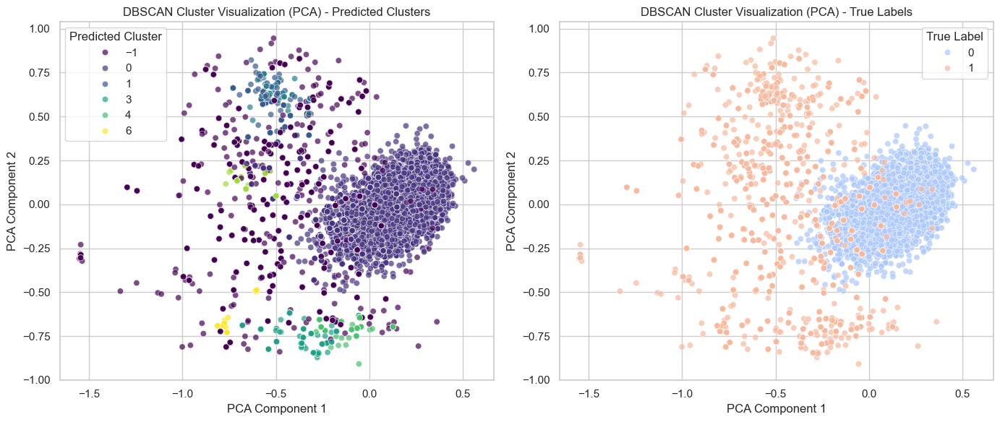

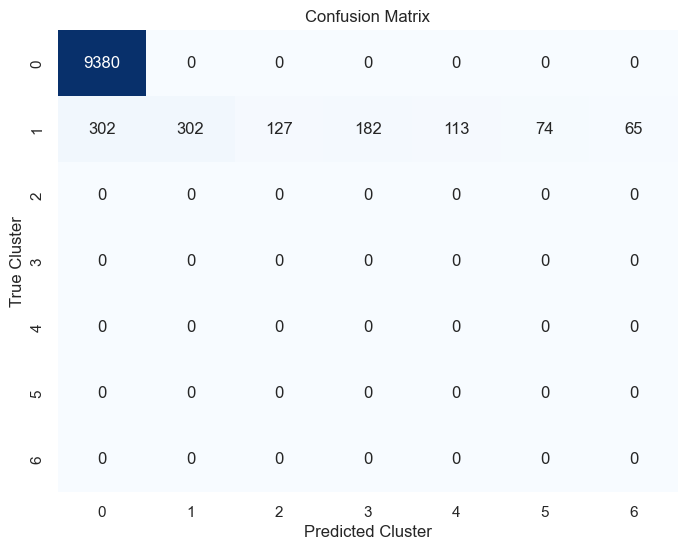

Average Silhouette Score: 0.4563


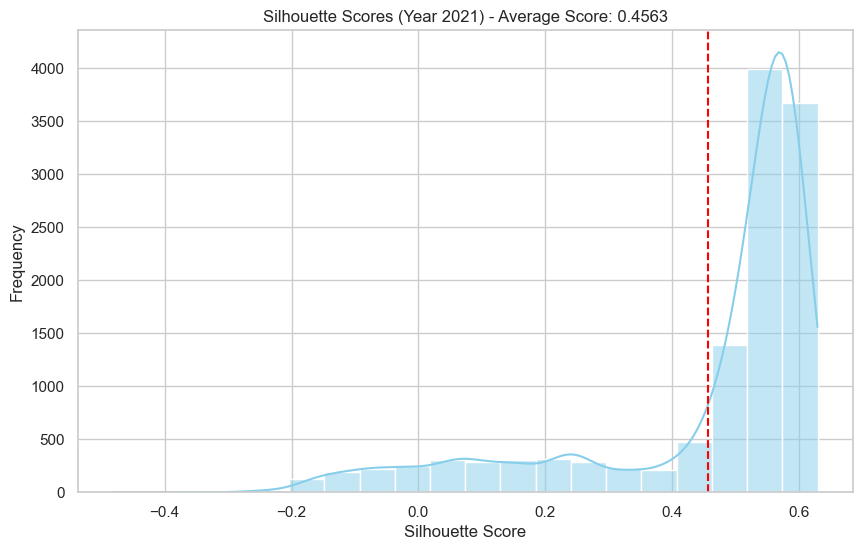

Best Purity for Year 2021: 0.9714
Best Parameters for Year 2021: {'eps': np.float64(0.27), 'min_samples': 60}
--------------------------------------------------
Clustering for Year 2022:


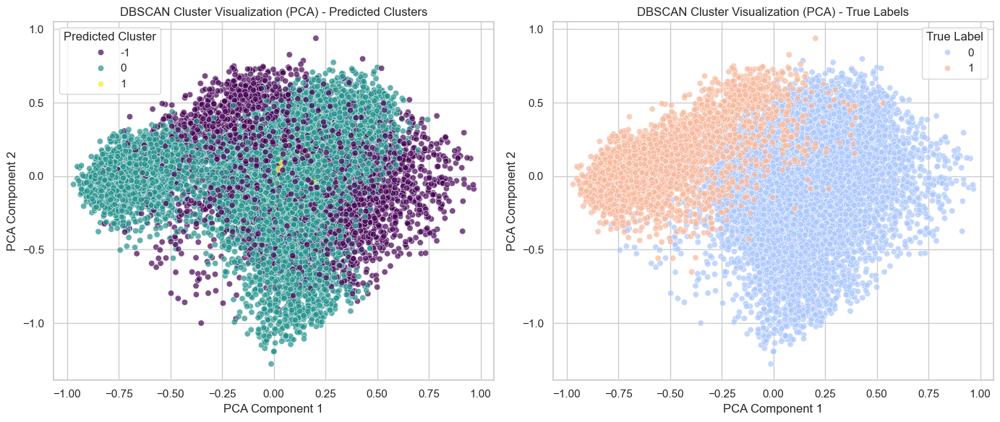

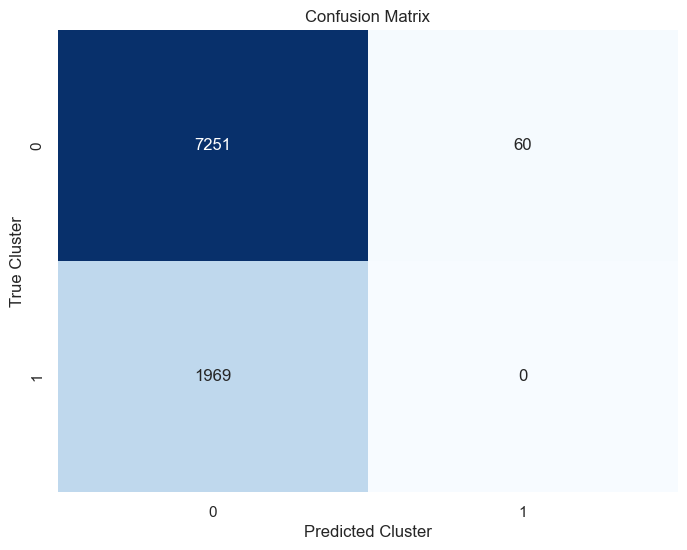

Average Silhouette Score: 0.2315


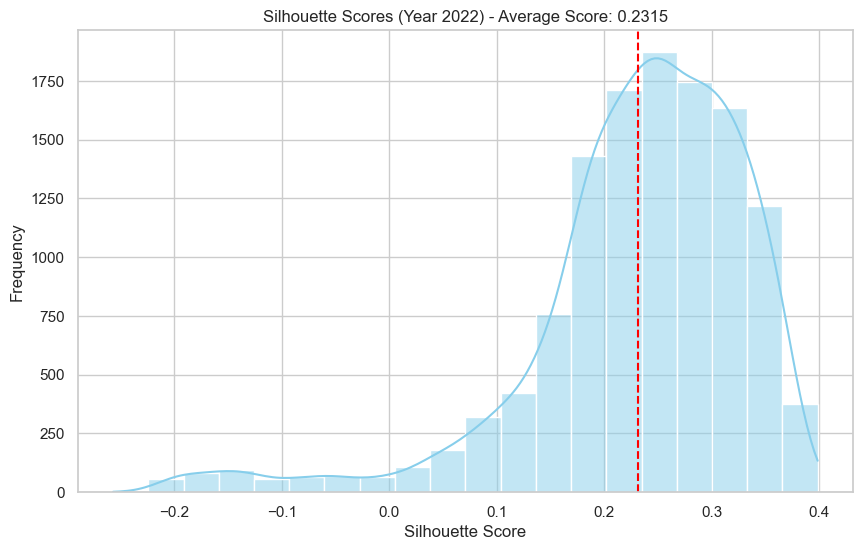

Best Purity for Year 2022: 0.7878
Best Parameters for Year 2022: {'eps': np.float64(0.27), 'min_samples': 60}
--------------------------------------------------
Clustering for Year 2023:


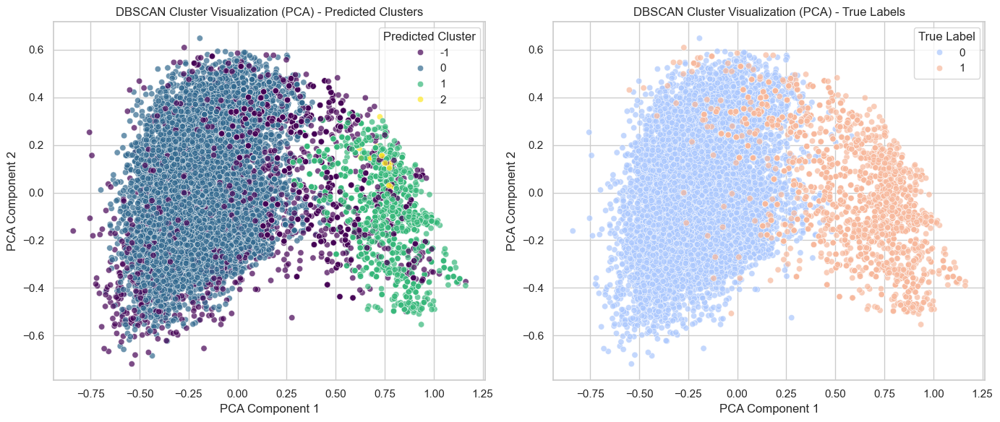

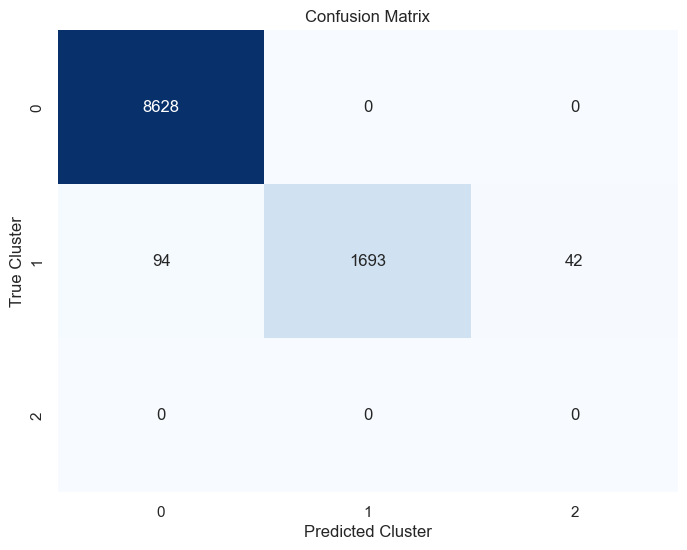

Average Silhouette Score: 0.2946


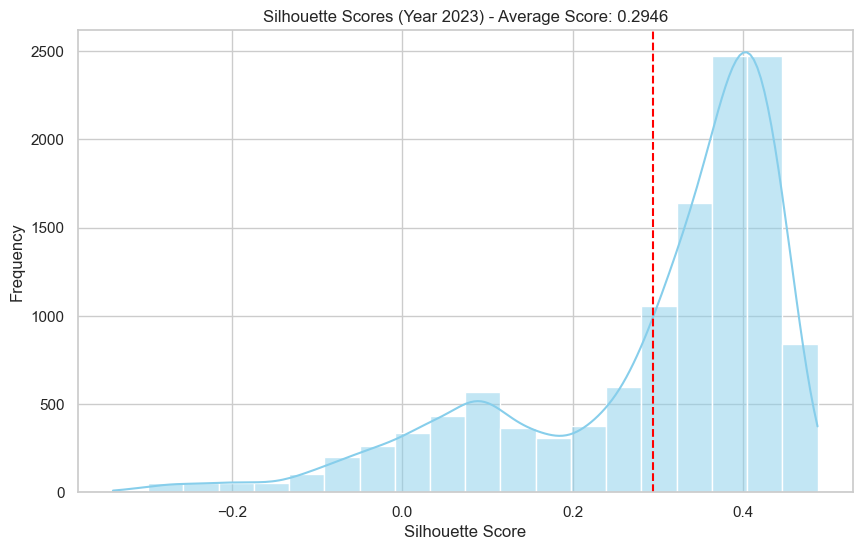

Best Purity for Year 2023: 0.9910
Best Parameters for Year 2023: {'eps': np.float64(0.27), 'min_samples': 60}
--------------------------------------------------


In [187]:
# Function to compute cluster purity
def calculate_cluster_purity(y_true, y_pred):
    """
    Calculate cluster purity.
    """
    contingency_matrix = confusion_matrix(y_true, y_pred)
    return np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

def perform_clustering_with_grid_search(data, eps_range, min_samples_range):
    """
    Perform DBSCAN clustering with grid search over eps and min_samples.
    Evaluate using cluster purity and visualize clusters using PCA.
    """
    # Split features and labels
    X = data.drop(columns=['label'])
    y = data['label']

    best_purity = 0.0
    best_params = None
    best_contingency_matrix = None
    best_y_pred = None

    # Grid search over eps and min_samples
    for eps in eps_range:
        for min_samples in min_samples_range:
            # Fit DBSCAN
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            dbscan.fit(X)

            # Predict clusters
            y_pred = dbscan.labels_

            # Filter out noise points (-1) for purity calculation
            valid_indices = y_pred != -1
            y_valid = y[valid_indices]
            y_pred_valid = y_pred[valid_indices]

            # Calculate cluster purity if valid clusters exist
            if len(np.unique(y_pred_valid)) > 1:
                contingency_matrix = confusion_matrix(y_valid, y_pred_valid)
                purity = calculate_cluster_purity(y_valid, y_pred_valid)

                if purity > best_purity:
                    best_purity = purity
                    best_params = {'eps': eps, 'min_samples': min_samples}
                    best_contingency_matrix = contingency_matrix
                    best_y_pred = y_pred

    # Visualize best clusters using PCA
    if best_y_pred is not None:
        visualize_with_pca(X, y,best_y_pred, title="DBSCAN Cluster Visualization (PCA)")
        plot_confusion_matrix(best_contingency_matrix)
        # Plot silhouette scores
        plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")
    else:
        print("No valid clusters found with the given parameter ranges.")

    return best_purity, best_params, best_contingency_matrix

# Datasets for the years 2021, 2022, and 2023
datasets = {
    "Year 2021": year_2021,
    "Year 2022": year_2022,
    "Year 2023": year_2023,
}

# Perform clustering for each year independently with grid search
for year, data in datasets.items():
    print(f"Clustering for {year}:")

    # Set grid search ranges for DBSCAN parameters
    eps_range = np.linspace(0.27, 0.40, 5)  # Example range for eps
    min_samples_range = range(60, 100, 200)   # Example range for min_samples
    
    best_purity, best_params, best_conf_matrix = perform_clustering_with_grid_search(
        data, eps_range, min_samples_range
    )
    print(f"Best Purity for {year}: {best_purity:.4f}")
    print(f"Best Parameters for {year}: {best_params}")
    print("-" * 50)


# 13. Gaussian Mixture Models

## 13.1. Simple Clustering

This code performs clustering using the Gaussian Mixture Model (GMM) for each dataset from 2021, 2022, and 2023. It evaluates the clustering performance by calculating the cluster purity, visualizing the clusters with PCA, and plotting confusion matrices and silhouette scores for each year.

Clustering for Year 2021:


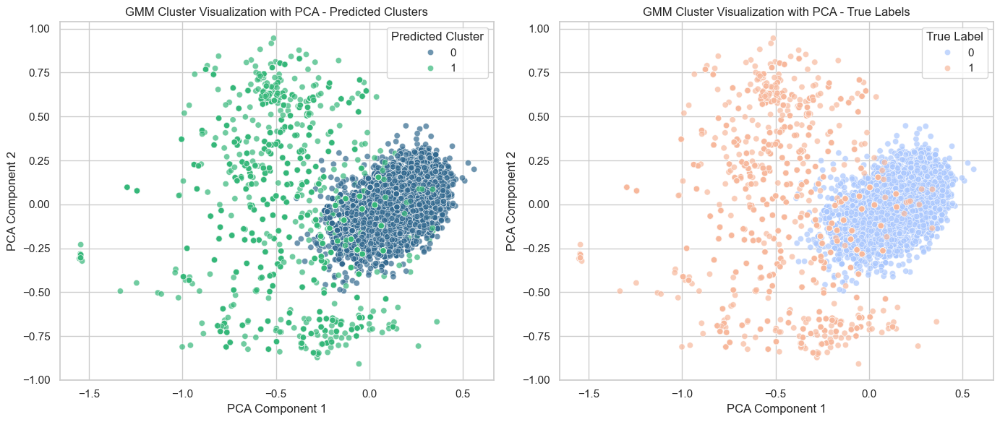

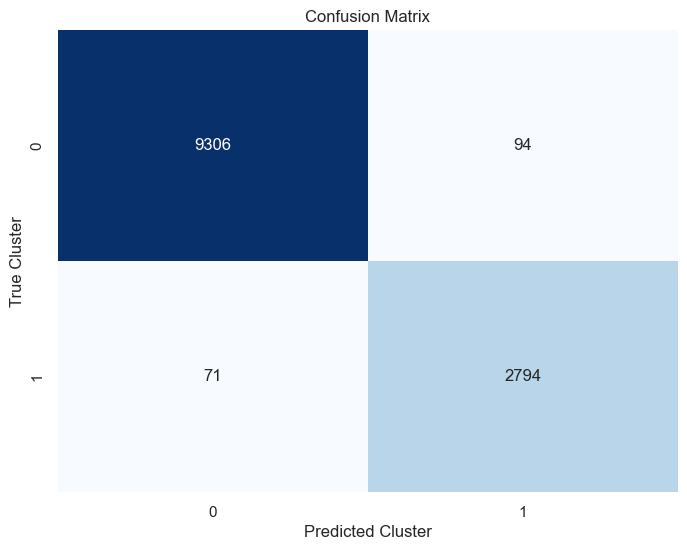

Average Silhouette Score: 0.4080


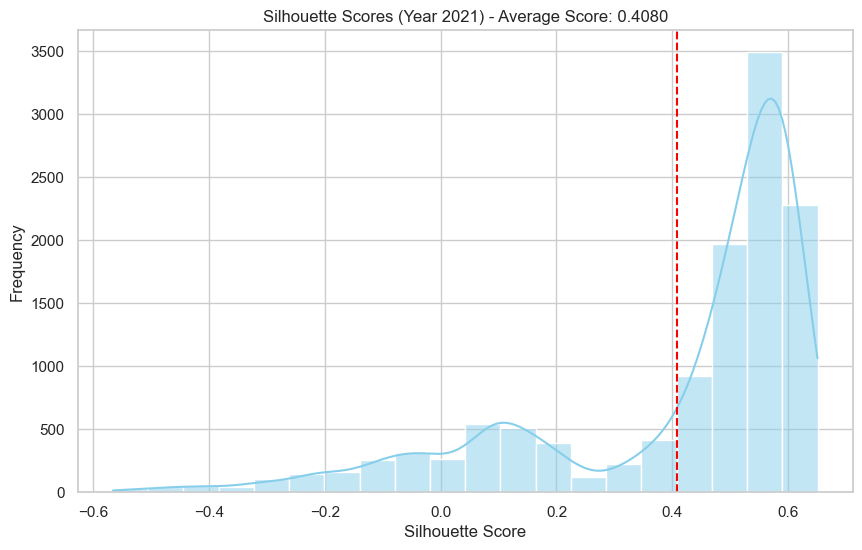

Cluster Purity for Year 2021: 0.9865
--------------------------------------------------
Clustering for Year 2022:


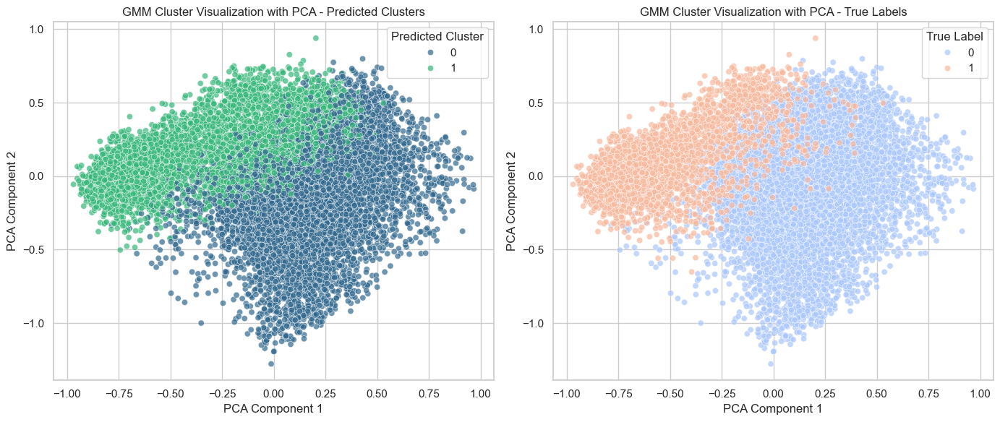

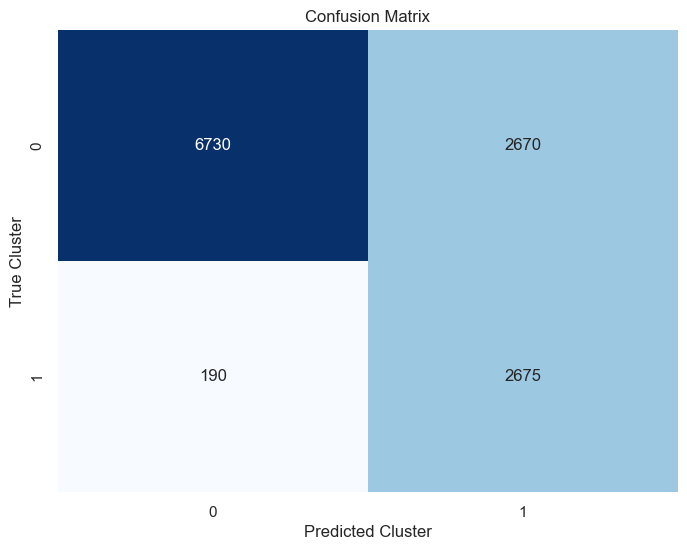

Average Silhouette Score: 0.1678


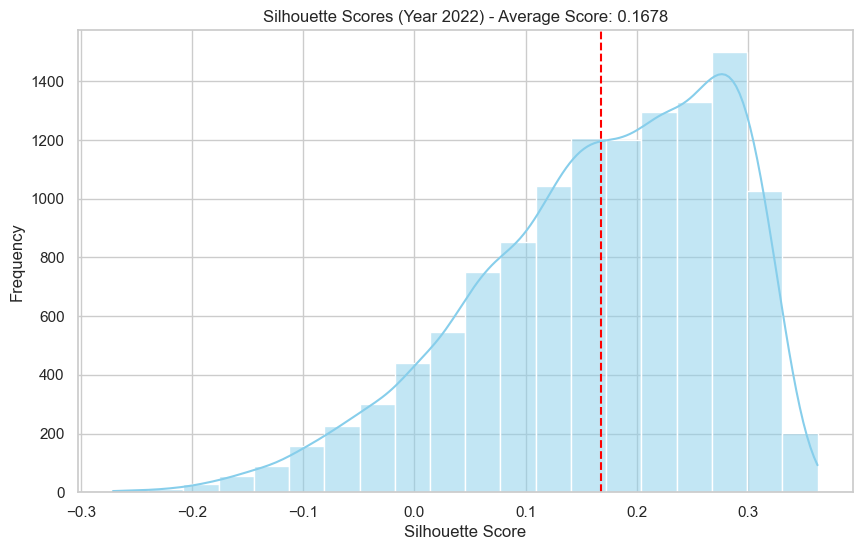

Cluster Purity for Year 2022: 0.7668
--------------------------------------------------
Clustering for Year 2023:


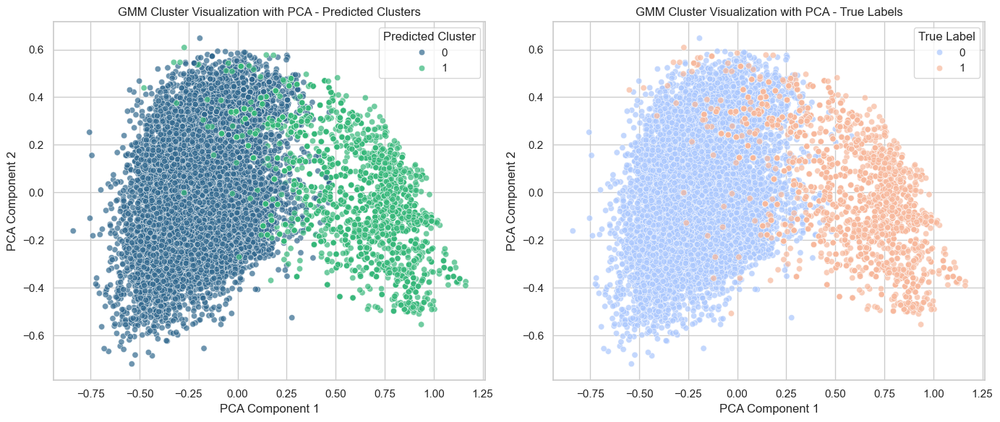

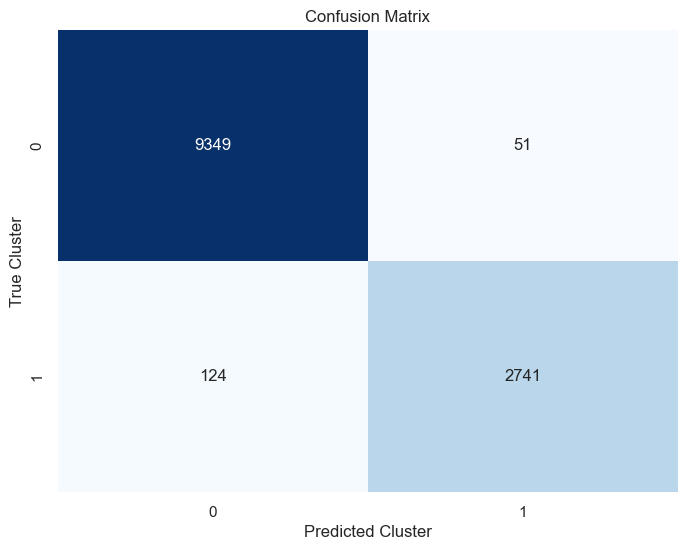

Average Silhouette Score: 0.3668


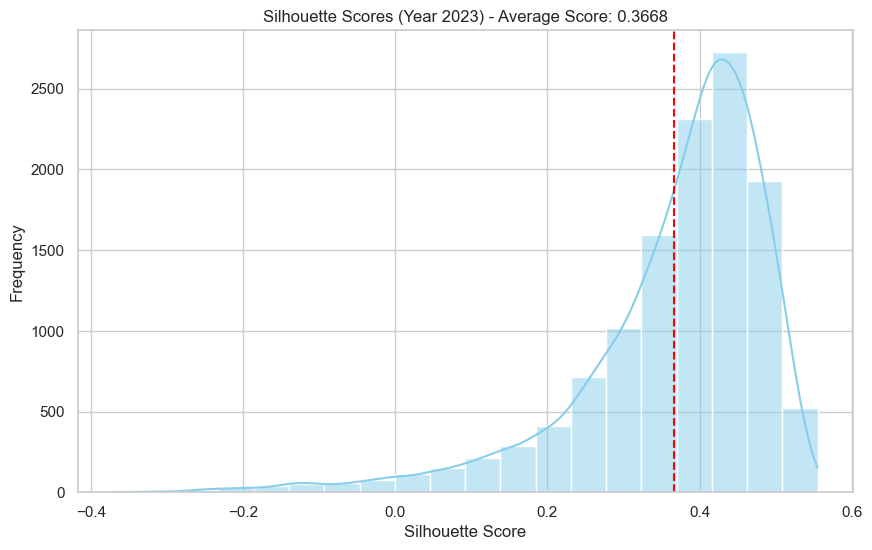

Cluster Purity for Year 2023: 0.9857
--------------------------------------------------


In [185]:
# Function to compute cluster purity
def calculate_cluster_purity(y_true, y_pred):
    """
    Calculate cluster purity.
    """
    contingency_matrix = confusion_matrix(y_true, y_pred)
    return np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

def perform_clustering(data, n_clusters=2):
    """
    Perform Gaussian Mixture Model clustering, evaluate using cluster purity, and visualize clusters.
    """
    # Split features and labels
    X = data.drop(columns=['label'])
    y = data['label']

    # Fit Gaussian Mixture Model
    gmm = GaussianMixture(n_components=n_clusters, random_state=42)
    gmm.fit(X)

    # Predict clusters
    y_pred = gmm.predict(X)

    # Calculate cluster purity
    contingency_matrix = confusion_matrix(y, y_pred)
    purity = calculate_cluster_purity(y, y_pred)

    # Visualize clusters with PCA
    visualize_with_pca(X, y, y_pred, title="GMM Cluster Visualization with PCA")

    # Visualize confusion matrix
    plot_confusion_matrix(contingency_matrix)
    
    # Plot silhouette scores
    plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")

    return purity, contingency_matrix

# Datasets for the years 2021, 2022, and 2023
datasets = {
    "Year 2021": year_2021,
    "Year 2022": year_2022,
    "Year 2023": year_2023,
}

# Perform clustering for each year independently
for year, data in datasets.items():
    print(f"Clustering for {year}:")

    # Perform clustering with Gaussian Mixture Model for the current year
    purity, conf_matrix = perform_clustering(data, n_clusters=2)
    print(f"Cluster Purity for {year}: {purity:.4f}")
    print("-" * 50)


## 13.2. Grid Search Clustering

This code performs clustering using Gaussian Mixture Model (GMM) on datasets from 2021, 2022, and 2023 with a grid search over GMM parameters like n_components, covariance_type, and init_params. It evaluates the best model using cluster purity, and visualizes the results using PCA, confusion matrices, and silhouette scores.


Clustering for Year 2021:

Best Parameters Found:
{'covariance_type': 'full', 'init_params': 'random', 'n_components': 2}
Best Cluster Purity: 0.9875


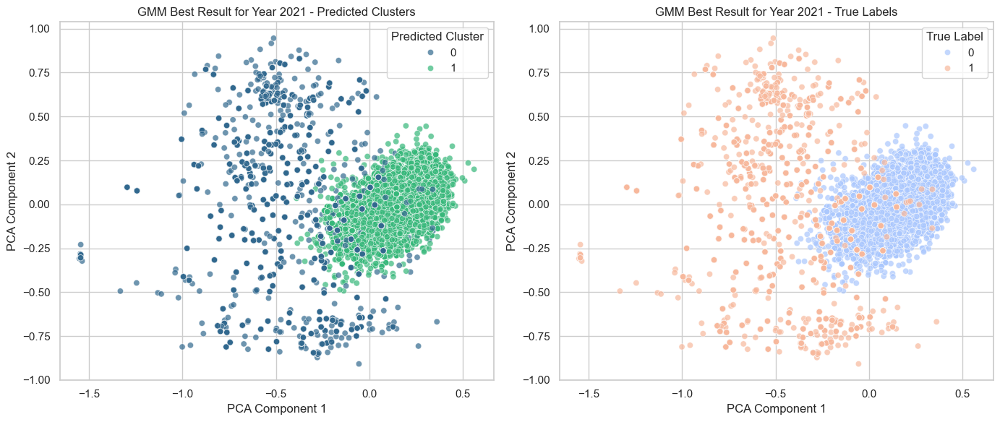

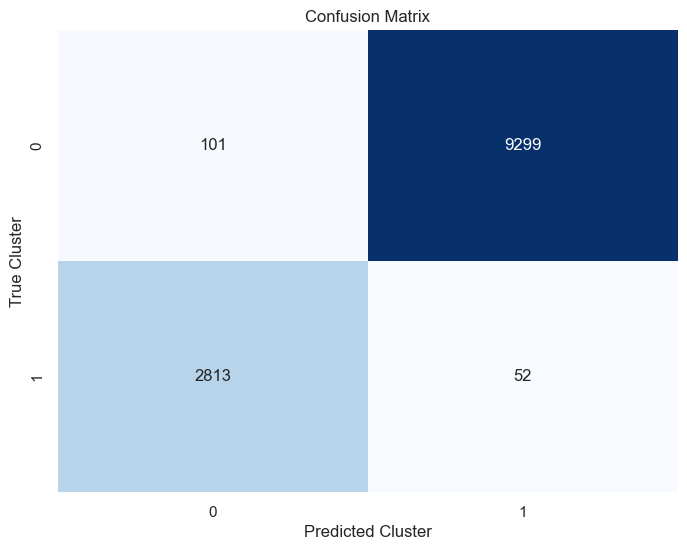

Average Silhouette Score: 0.4056


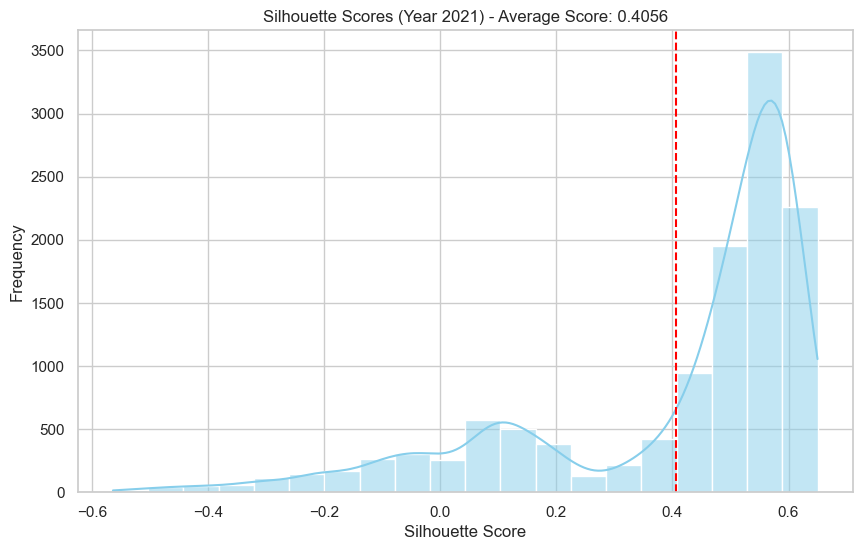

--------------------------------------------------

Clustering for Year 2022:

Best Parameters Found:
{'covariance_type': 'diag', 'init_params': 'kmeans', 'n_components': 5}
Best Cluster Purity: 0.9730


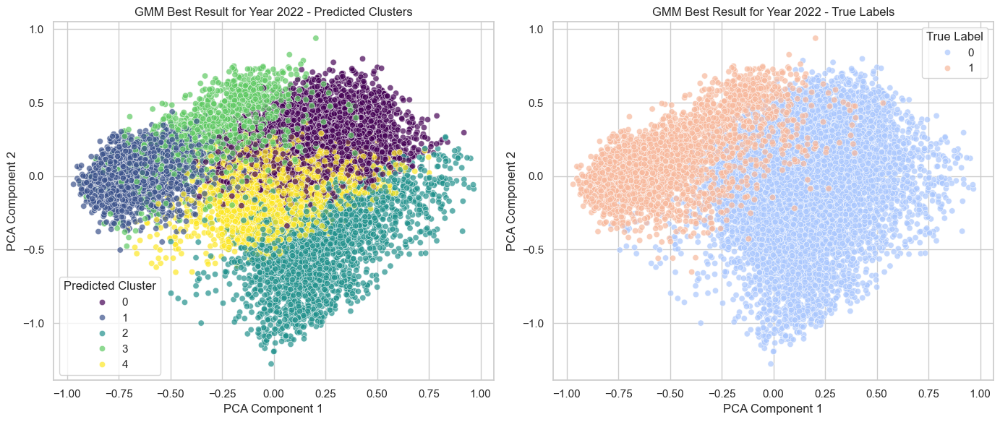

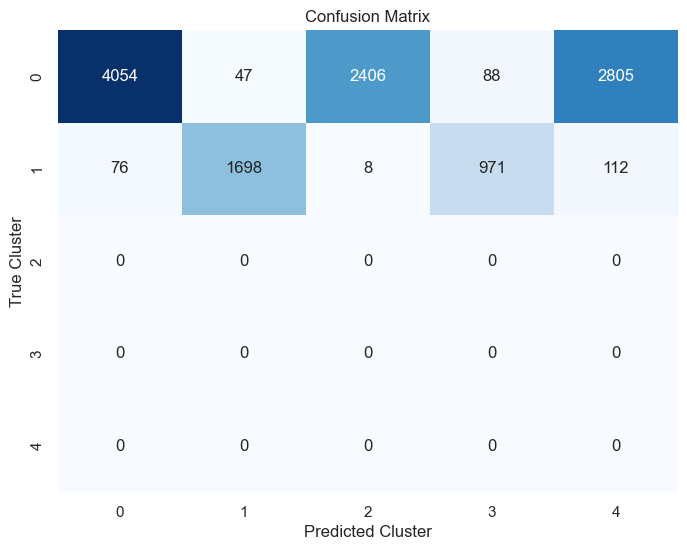

Average Silhouette Score: 0.1480


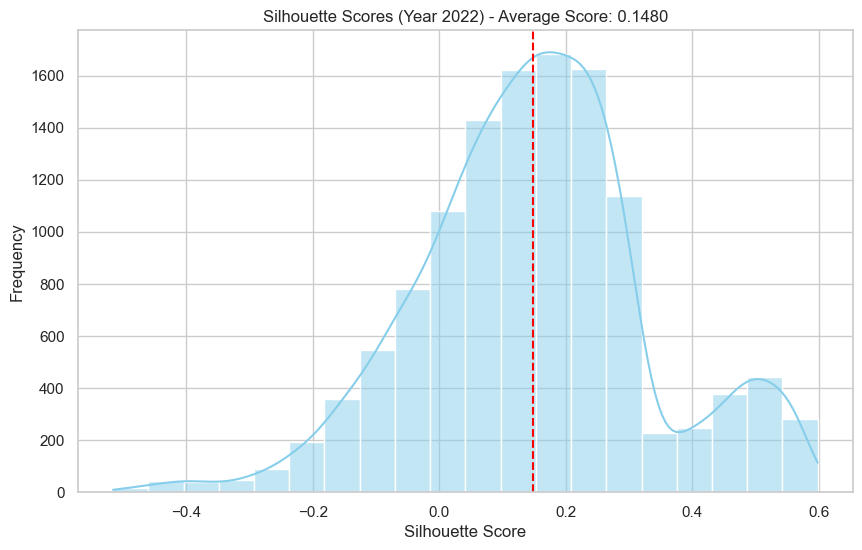

--------------------------------------------------

Clustering for Year 2023:

Best Parameters Found:
{'covariance_type': 'full', 'init_params': 'kmeans', 'n_components': 5}
Best Cluster Purity: 0.9901


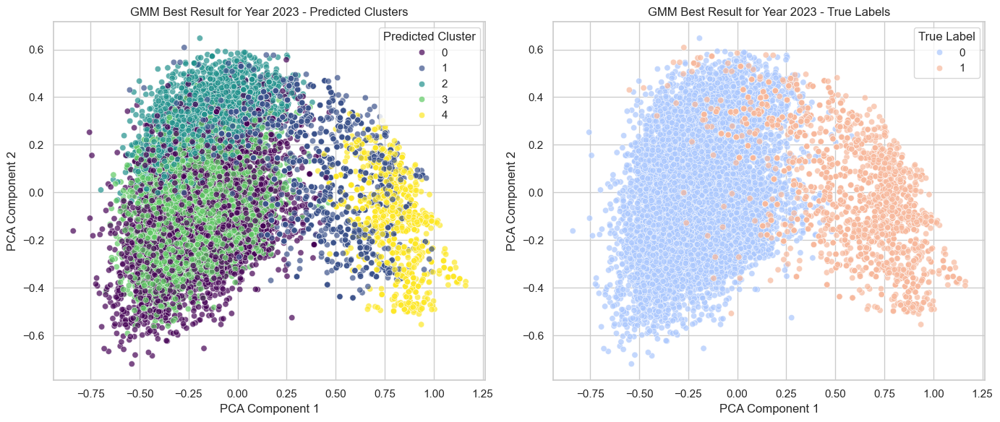

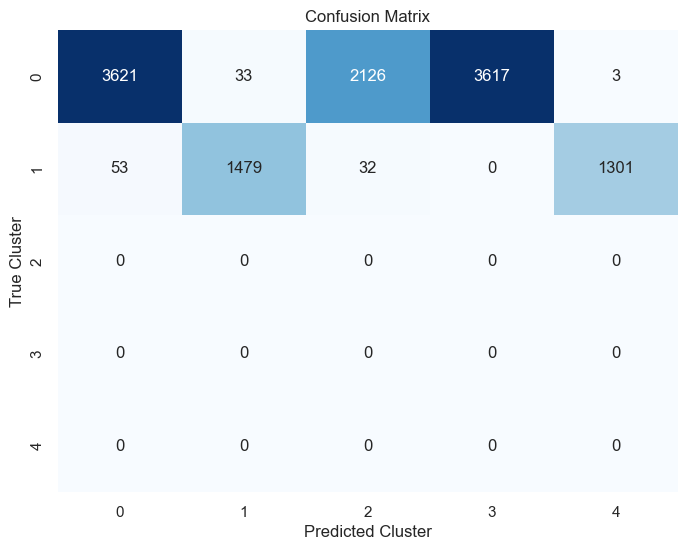

Average Silhouette Score: 0.0704


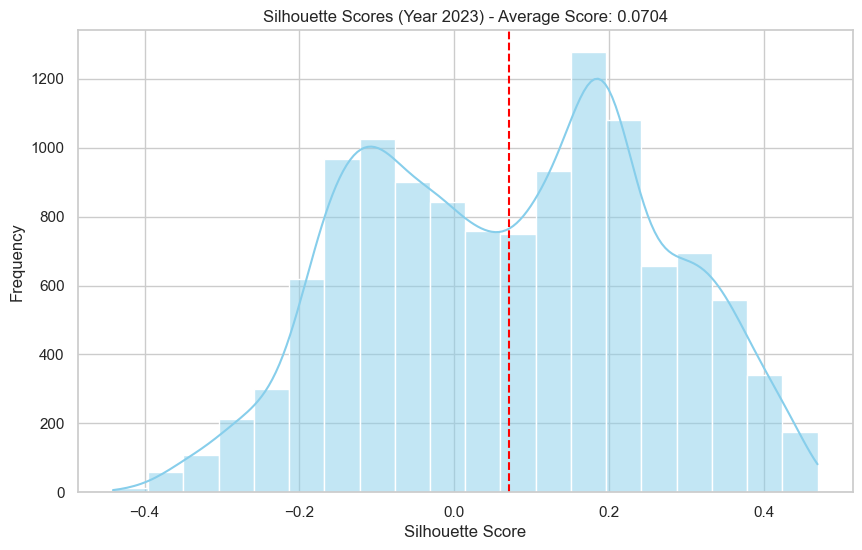

--------------------------------------------------


In [186]:
# Function to compute cluster purity
def calculate_cluster_purity(y_true, y_pred):
    contingency_matrix = confusion_matrix(y_true, y_pred)
    return np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

# Function to perform GMM clustering
def perform_clustering(data, n_clusters=2, covariance_type='full', init_params='kmeans'):
    X = data.drop(columns=['label'])
    y = data['label']

    gmm = GaussianMixture(n_components=n_clusters, 
                          covariance_type=covariance_type, 
                          init_params=init_params, 
                          random_state=42)
    gmm.fit(X)
    y_pred = gmm.predict(X)

    purity = calculate_cluster_purity(y, y_pred)
    return purity, y_pred, X, y

# Grid Search for GMM Parameters
def grid_search_gmm(data, param_grid):
    best_purity = -1
    best_params = None
    best_conf_matrix = None

    # Iterate over all parameter combinations
    for params in ParameterGrid(param_grid):
        # print(f"Testing params: {params}")
        purity, y_pred, X, y = perform_clustering(data, 
                                                  n_clusters=params['n_components'],
                                                  covariance_type=params['covariance_type'],
                                                  init_params=params['init_params'])
        # print(f"Cluster Purity: {purity:.4f}")

        if purity > best_purity:
            best_purity = purity
            best_params = params
            best_conf_matrix = confusion_matrix(y, y_pred)

    print("\nBest Parameters Found:")
    print(best_params)
    print(f"Best Cluster Purity: {best_purity:.4f}")

    # Return results
    return best_params, best_purity, best_conf_matrix

# Datasets for the years 2021, 2022, and 2023
datasets = {
    "Year 2021": year_2021,
    "Year 2022": year_2022,
    "Year 2023": year_2023,
}

# Grid Search Parameters
param_grid = {
    'n_components': [2, 3, 4, 5],              # Number of clusters
    'covariance_type': ['full', 'tied', 'diag', 'spherical'],
    'init_params': ['kmeans', 'random']
}

# Perform grid search for each dataset
for year, data in datasets.items():
    print(f"\nClustering for {year}:")
    best_params, best_purity, best_conf_matrix = grid_search_gmm(data, param_grid)

    # Visualize Results with Best Parameters
    _, y_pred, X, y = perform_clustering(data, 
                                         n_clusters=best_params['n_components'],
                                         covariance_type=best_params['covariance_type'],
                                         init_params=best_params['init_params'])

    visualize_with_pca(X, y, y_pred, title=f"GMM Best Result for {year}")
    plot_confusion_matrix(best_conf_matrix)
    # Plot silhouette scores
    plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")
    print("-" * 50)
    
